# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "afriat_v2_4_"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 5q26ed5u
Name: rebel-destroyer-153
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/5q26ed5u
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_155931-5q26ed5u/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2558,3332,9353
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2558,2569,1679,3423,1658,3356
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4446,10797
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 647,777,2386
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 647,633,429,867,391,843
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1138,2672
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:21<3:34:07, 21.45s/it]

Epoch 1/600:   0%|          | 1/600 [00:21<3:34:07, 21.45s/it, v_num=5u_1, total_loss_train=3.71e+3, kl_local_train=53.7]

Epoch 2/600:   0%|          | 1/600 [00:21<3:34:07, 21.45s/it, v_num=5u_1, total_loss_train=3.71e+3, kl_local_train=53.7]

Epoch 2/600:   0%|          | 2/600 [00:39<3:13:40, 19.43s/it, v_num=5u_1, total_loss_train=3.71e+3, kl_local_train=53.7]

Epoch 2/600:   0%|          | 2/600 [00:39<3:13:40, 19.43s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=79.7]

Epoch 3/600:   0%|          | 2/600 [00:39<3:13:40, 19.43s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=79.7]

Epoch 3/600:   0%|          | 3/600 [00:57<3:07:41, 18.86s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=79.7]

Epoch 3/600:   0%|          | 3/600 [00:57<3:07:41, 18.86s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=80.2] 

Epoch 4/600:   0%|          | 3/600 [00:57<3:07:41, 18.86s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=80.2]

Epoch 4/600:   1%|          | 4/600 [01:14<2:58:33, 17.97s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=80.2]

Epoch 4/600:   1%|          | 4/600 [01:14<2:58:33, 17.97s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=77.2]

Epoch 5/600:   1%|          | 4/600 [01:14<2:58:33, 17.97s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=77.2]

Epoch 5/600:   1%|          | 5/600 [01:31<2:55:53, 17.74s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=77.2]

Epoch 5/600:   1%|          | 5/600 [01:31<2:55:53, 17.74s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=71.4]

Epoch 6/600:   1%|          | 5/600 [01:33<2:55:53, 17.74s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=71.4]

Epoch 6/600:   1%|          | 6/600 [01:49<2:54:47, 17.66s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=71.4]

Epoch 6/600:   1%|          | 6/600 [01:49<2:54:47, 17.66s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 7/600:   1%|          | 6/600 [01:49<2:54:47, 17.66s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 7/600:   1%|          | 7/600 [02:05<2:49:21, 17.14s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 7/600:   1%|          | 7/600 [02:05<2:49:21, 17.14s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 8/600:   1%|          | 7/600 [02:05<2:49:21, 17.14s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 8/600:   1%|▏         | 8/600 [02:21<2:47:26, 16.97s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 8/600:   1%|▏         | 8/600 [02:21<2:47:26, 16.97s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=34.3, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 9/600:   1%|▏         | 8/600 [02:21<2:47:26, 16.97s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=34.3, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 9/600:   2%|▏         | 9/600 [02:38<2:45:52, 16.84s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=34.3, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 9/600:   2%|▏         | 9/600 [02:38<2:45:52, 16.84s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 10/600:   2%|▏         | 9/600 [02:38<2:45:52, 16.84s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 10/600:   2%|▏         | 10/600 [02:55<2:45:30, 16.83s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=46.3, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 10/600:   2%|▏         | 10/600 [02:55<2:45:30, 16.83s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=87.5, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 11/600:   2%|▏         | 10/600 [02:56<2:45:30, 16.83s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=87.5, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 11/600:   2%|▏         | 11/600 [03:13<2:48:39, 17.18s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=87.5, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0349]

Epoch 11/600:   2%|▏         | 11/600 [03:13<2:48:39, 17.18s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=151, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]   

Epoch 12/600:   2%|▏         | 11/600 [03:13<2:48:39, 17.18s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=151, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 12/600:   2%|▏         | 12/600 [03:29<2:44:47, 16.82s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=151, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 12/600:   2%|▏         | 12/600 [03:29<2:44:47, 16.82s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=218, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472] 

Epoch 13/600:   2%|▏         | 12/600 [03:29<2:44:47, 16.82s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=218, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 13/600:   2%|▏         | 13/600 [03:44<2:41:39, 16.52s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=218, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 13/600:   2%|▏         | 13/600 [03:44<2:41:39, 16.52s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=265, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 14/600:   2%|▏         | 13/600 [03:44<2:41:39, 16.52s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=265, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 14/600:   2%|▏         | 14/600 [04:00<2:39:25, 16.32s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=265, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 14/600:   2%|▏         | 14/600 [04:00<2:39:25, 16.32s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=280, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 15/600:   2%|▏         | 14/600 [04:00<2:39:25, 16.32s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=280, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 15/600:   2%|▎         | 15/600 [04:17<2:41:05, 16.52s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=280, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 15/600:   2%|▎         | 15/600 [04:17<2:41:05, 16.52s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=288, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 16/600:   2%|▎         | 15/600 [04:19<2:41:05, 16.52s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=288, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 16/600:   3%|▎         | 16/600 [04:35<2:43:23, 16.79s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=288, metric_mi|status_control_train=0.0258, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.0213, metric_mi|mouse_train=0.0472]

Epoch 16/600:   3%|▎         | 16/600 [04:35<2:43:23, 16.79s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=298, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 17/600:   3%|▎         | 16/600 [04:35<2:43:23, 16.79s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=298, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 17/600:   3%|▎         | 17/600 [04:51<2:42:11, 16.69s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=298, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 17/600:   3%|▎         | 17/600 [04:51<2:42:11, 16.69s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=337, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 18/600:   3%|▎         | 17/600 [04:51<2:42:11, 16.69s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=337, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 18/600:   3%|▎         | 18/600 [05:08<2:41:58, 16.70s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=337, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 18/600:   3%|▎         | 18/600 [05:08<2:41:58, 16.70s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=418, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 19/600:   3%|▎         | 18/600 [05:08<2:41:58, 16.70s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=418, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 19/600:   3%|▎         | 19/600 [05:24<2:40:58, 16.62s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=418, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 19/600:   3%|▎         | 19/600 [05:24<2:40:58, 16.62s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=470, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 20/600:   3%|▎         | 19/600 [05:24<2:40:58, 16.62s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=470, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 20/600:   3%|▎         | 20/600 [05:41<2:41:04, 16.66s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=470, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 20/600:   3%|▎         | 20/600 [05:41<2:41:04, 16.66s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=536, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792] 

Epoch 21/600:   3%|▎         | 20/600 [05:43<2:41:04, 16.66s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=536, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 21/600:   4%|▎         | 21/600 [05:59<2:45:27, 17.15s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=536, metric_mi|status_control_train=0.0488, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 21/600:   4%|▎         | 21/600 [05:59<2:45:27, 17.15s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=502, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]  

Epoch 22/600:   4%|▎         | 21/600 [05:59<2:45:27, 17.15s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=502, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 22/600:   4%|▎         | 22/600 [06:16<2:43:07, 16.93s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=502, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 22/600:   4%|▎         | 22/600 [06:16<2:43:07, 16.93s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=522, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 23/600:   4%|▎         | 22/600 [06:16<2:43:07, 16.93s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=522, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 23/600:   4%|▍         | 23/600 [06:32<2:40:53, 16.73s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=522, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 23/600:   4%|▍         | 23/600 [06:32<2:40:53, 16.73s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=580, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 24/600:   4%|▍         | 23/600 [06:32<2:40:53, 16.73s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=580, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 24/600:   4%|▍         | 24/600 [06:49<2:40:11, 16.69s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=580, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 24/600:   4%|▍         | 24/600 [06:49<2:40:11, 16.69s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=642, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 25/600:   4%|▍         | 24/600 [06:49<2:40:11, 16.69s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=642, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 25/600:   4%|▍         | 25/600 [07:06<2:41:35, 16.86s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=642, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 25/600:   4%|▍         | 25/600 [07:06<2:41:35, 16.86s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=695, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 26/600:   4%|▍         | 25/600 [07:07<2:41:35, 16.86s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=695, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 26/600:   4%|▍         | 26/600 [07:24<2:44:57, 17.24s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=695, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.111]

Epoch 26/600:   4%|▍         | 26/600 [07:24<2:44:57, 17.24s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=785, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]  

Epoch 27/600:   4%|▍         | 26/600 [07:24<2:44:57, 17.24s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=785, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 27/600:   4%|▍         | 27/600 [07:41<2:42:41, 17.04s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=785, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 27/600:   4%|▍         | 27/600 [07:41<2:42:41, 17.04s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=814, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 28/600:   4%|▍         | 27/600 [07:41<2:42:41, 17.04s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=814, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 28/600:   5%|▍         | 28/600 [07:57<2:41:36, 16.95s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=814, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 28/600:   5%|▍         | 28/600 [07:57<2:41:36, 16.95s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=820, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 29/600:   5%|▍         | 28/600 [07:57<2:41:36, 16.95s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=820, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 29/600:   5%|▍         | 29/600 [08:14<2:40:42, 16.89s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=820, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 29/600:   5%|▍         | 29/600 [08:14<2:40:42, 16.89s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=847, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 30/600:   5%|▍         | 29/600 [08:14<2:40:42, 16.89s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=847, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 30/600:   5%|▌         | 30/600 [08:31<2:40:34, 16.90s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=847, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 30/600:   5%|▌         | 30/600 [08:31<2:40:34, 16.90s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=845, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 31/600:   5%|▌         | 30/600 [08:33<2:40:34, 16.90s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=845, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 31/600:   5%|▌         | 31/600 [08:49<2:43:58, 17.29s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=845, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.118]

Epoch 31/600:   5%|▌         | 31/600 [08:49<2:43:58, 17.29s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=851, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 32/600:   5%|▌         | 31/600 [08:49<2:43:58, 17.29s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=851, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 32/600:   5%|▌         | 32/600 [09:06<2:41:46, 17.09s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=851, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 32/600:   5%|▌         | 32/600 [09:06<2:41:46, 17.09s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=831, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 33/600:   5%|▌         | 32/600 [09:06<2:41:46, 17.09s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=831, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 33/600:   6%|▌         | 33/600 [09:23<2:41:38, 17.10s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=831, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 33/600:   6%|▌         | 33/600 [09:23<2:41:38, 17.10s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=803, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 34/600:   6%|▌         | 33/600 [09:23<2:41:38, 17.10s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=803, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 34/600:   6%|▌         | 34/600 [09:40<2:41:10, 17.09s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=803, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 34/600:   6%|▌         | 34/600 [09:40<2:41:10, 17.09s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=781, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 35/600:   6%|▌         | 34/600 [09:40<2:41:10, 17.09s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=781, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 35/600:   6%|▌         | 35/600 [09:57<2:40:24, 17.03s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=781, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 35/600:   6%|▌         | 35/600 [09:57<2:40:24, 17.03s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=821, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 36/600:   6%|▌         | 35/600 [09:58<2:40:24, 17.03s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=821, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 36/600:   6%|▌         | 36/600 [10:15<2:44:14, 17.47s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=821, metric_mi|status_control_train=0.131, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 36/600:   6%|▌         | 36/600 [10:15<2:44:14, 17.47s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=813, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 37/600:   6%|▌         | 36/600 [10:15<2:44:14, 17.47s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=813, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 37/600:   6%|▌         | 37/600 [10:32<2:41:50, 17.25s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=813, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 37/600:   6%|▌         | 37/600 [10:32<2:41:50, 17.25s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=853, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 38/600:   6%|▌         | 37/600 [10:32<2:41:50, 17.25s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=853, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 38/600:   6%|▋         | 38/600 [10:49<2:40:13, 17.11s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=853, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 38/600:   6%|▋         | 38/600 [10:49<2:40:13, 17.11s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=814, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 39/600:   6%|▋         | 38/600 [10:49<2:40:13, 17.11s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=814, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 39/600:   6%|▋         | 39/600 [11:06<2:38:56, 17.00s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=814, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 39/600:   6%|▋         | 39/600 [11:06<2:38:56, 17.00s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=856, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 40/600:   6%|▋         | 39/600 [11:06<2:38:56, 17.00s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=856, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 40/600:   7%|▋         | 40/600 [11:23<2:38:20, 16.97s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=856, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 40/600:   7%|▋         | 40/600 [11:23<2:38:20, 16.97s/it, v_num=5u_1, total_loss_train=3.28e+3, kl_local_train=857, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 41/600:   7%|▋         | 40/600 [11:24<2:38:20, 16.97s/it, v_num=5u_1, total_loss_train=3.28e+3, kl_local_train=857, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 41/600:   7%|▋         | 41/600 [11:41<2:41:56, 17.38s/it, v_num=5u_1, total_loss_train=3.28e+3, kl_local_train=857, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.121]

Epoch 41/600:   7%|▋         | 41/600 [11:41<2:41:56, 17.38s/it, v_num=5u_1, total_loss_train=3.28e+3, kl_local_train=841, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 42/600:   7%|▋         | 41/600 [11:41<2:41:56, 17.38s/it, v_num=5u_1, total_loss_train=3.28e+3, kl_local_train=841, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 42/600:   7%|▋         | 42/600 [11:57<2:39:27, 17.15s/it, v_num=5u_1, total_loss_train=3.28e+3, kl_local_train=841, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 42/600:   7%|▋         | 42/600 [11:57<2:39:27, 17.15s/it, v_num=5u_1, total_loss_train=3.29e+3, kl_local_train=814, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 43/600:   7%|▋         | 42/600 [11:58<2:39:27, 17.15s/it, v_num=5u_1, total_loss_train=3.29e+3, kl_local_train=814, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 43/600:   7%|▋         | 43/600 [12:14<2:38:09, 17.04s/it, v_num=5u_1, total_loss_train=3.29e+3, kl_local_train=814, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 43/600:   7%|▋         | 43/600 [12:14<2:38:09, 17.04s/it, v_num=5u_1, total_loss_train=3.29e+3, kl_local_train=847, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 44/600:   7%|▋         | 43/600 [12:14<2:38:09, 17.04s/it, v_num=5u_1, total_loss_train=3.29e+3, kl_local_train=847, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 44/600:   7%|▋         | 44/600 [12:33<2:43:29, 17.64s/it, v_num=5u_1, total_loss_train=3.29e+3, kl_local_train=847, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 44/600:   7%|▋         | 44/600 [12:33<2:43:29, 17.64s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=915, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119] 

Epoch 45/600:   7%|▋         | 44/600 [12:33<2:43:29, 17.64s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=915, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 45/600:   8%|▊         | 45/600 [12:50<2:40:57, 17.40s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=915, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 45/600:   8%|▊         | 45/600 [12:50<2:40:57, 17.40s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=868, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 46/600:   8%|▊         | 45/600 [12:52<2:40:57, 17.40s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=868, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 46/600:   8%|▊         | 46/600 [13:09<2:44:47, 17.85s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=868, metric_mi|status_control_train=0.118, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 46/600:   8%|▊         | 46/600 [13:09<2:44:47, 17.85s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=841, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 47/600:   8%|▊         | 46/600 [13:09<2:44:47, 17.85s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=841, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 47/600:   8%|▊         | 47/600 [13:26<2:41:21, 17.51s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=841, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 47/600:   8%|▊         | 47/600 [13:26<2:41:21, 17.51s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=843, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 48/600:   8%|▊         | 47/600 [13:26<2:41:21, 17.51s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=843, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 48/600:   8%|▊         | 48/600 [13:43<2:39:55, 17.38s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=843, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 48/600:   8%|▊         | 48/600 [13:43<2:39:55, 17.38s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=758, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 49/600:   8%|▊         | 48/600 [13:43<2:39:55, 17.38s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=758, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 49/600:   8%|▊         | 49/600 [14:00<2:39:42, 17.39s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=758, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 49/600:   8%|▊         | 49/600 [14:00<2:39:42, 17.39s/it, v_num=5u_1, total_loss_train=3.33e+3, kl_local_train=804, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 50/600:   8%|▊         | 49/600 [14:00<2:39:42, 17.39s/it, v_num=5u_1, total_loss_train=3.33e+3, kl_local_train=804, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 50/600:   8%|▊         | 50/600 [14:18<2:39:40, 17.42s/it, v_num=5u_1, total_loss_train=3.33e+3, kl_local_train=804, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 50/600:   8%|▊         | 50/600 [14:18<2:39:40, 17.42s/it, v_num=5u_1, total_loss_train=3.33e+3, kl_local_train=815, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 51/600:   8%|▊         | 50/600 [14:19<2:39:40, 17.42s/it, v_num=5u_1, total_loss_train=3.33e+3, kl_local_train=815, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 51/600:   8%|▊         | 51/600 [14:36<2:42:22, 17.75s/it, v_num=5u_1, total_loss_train=3.33e+3, kl_local_train=815, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.116, metric_mi|mouse_train=0.115]

Epoch 51/600:   8%|▊         | 51/600 [14:36<2:42:22, 17.75s/it, v_num=5u_1, total_loss_train=3.33e+3, kl_local_train=825, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 52/600:   8%|▊         | 51/600 [14:36<2:42:22, 17.75s/it, v_num=5u_1, total_loss_train=3.33e+3, kl_local_train=825, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 52/600:   9%|▊         | 52/600 [14:53<2:40:01, 17.52s/it, v_num=5u_1, total_loss_train=3.33e+3, kl_local_train=825, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 52/600:   9%|▊         | 52/600 [14:53<2:40:01, 17.52s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=869, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 53/600:   9%|▊         | 52/600 [14:53<2:40:01, 17.52s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=869, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 53/600:   9%|▉         | 53/600 [15:10<2:38:33, 17.39s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=869, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 53/600:   9%|▉         | 53/600 [15:10<2:38:33, 17.39s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=830, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 54/600:   9%|▉         | 53/600 [15:10<2:38:33, 17.39s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=830, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 54/600:   9%|▉         | 54/600 [15:27<2:37:08, 17.27s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=830, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 54/600:   9%|▉         | 54/600 [15:27<2:37:08, 17.27s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=864, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 55/600:   9%|▉         | 54/600 [15:27<2:37:08, 17.27s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=864, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 55/600:   9%|▉         | 55/600 [15:45<2:36:45, 17.26s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=864, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 55/600:   9%|▉         | 55/600 [15:45<2:36:45, 17.26s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=924, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 56/600:   9%|▉         | 55/600 [15:46<2:36:45, 17.26s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=924, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 56/600:   9%|▉         | 56/600 [16:03<2:39:59, 17.65s/it, v_num=5u_1, total_loss_train=3.32e+3, kl_local_train=924, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.111, metric_mi|mouse_train=0.111]

Epoch 56/600:   9%|▉         | 56/600 [16:03<2:39:59, 17.65s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=883, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]   

Epoch 57/600:   9%|▉         | 56/600 [16:03<2:39:59, 17.65s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=883, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 57/600:  10%|▉         | 57/600 [16:20<2:38:38, 17.53s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=883, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 57/600:  10%|▉         | 57/600 [16:20<2:38:38, 17.53s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=831, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 58/600:  10%|▉         | 57/600 [16:20<2:38:38, 17.53s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=831, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 58/600:  10%|▉         | 58/600 [16:37<2:37:04, 17.39s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=831, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 58/600:  10%|▉         | 58/600 [16:37<2:37:04, 17.39s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=819, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 59/600:  10%|▉         | 58/600 [16:37<2:37:04, 17.39s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=819, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 59/600:  10%|▉         | 59/600 [16:54<2:35:35, 17.26s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=819, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 59/600:  10%|▉         | 59/600 [16:54<2:35:35, 17.26s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=797, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 60/600:  10%|▉         | 59/600 [16:54<2:35:35, 17.26s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=797, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 60/600:  10%|█         | 60/600 [17:11<2:34:41, 17.19s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=797, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 60/600:  10%|█         | 60/600 [17:11<2:34:41, 17.19s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=799, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 61/600:  10%|█         | 60/600 [17:13<2:34:41, 17.19s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=799, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 61/600:  10%|█         | 61/600 [17:31<2:40:04, 17.82s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=799, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 61/600:  10%|█         | 61/600 [17:31<2:40:04, 17.82s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=611, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 62/600:  10%|█         | 61/600 [17:31<2:40:04, 17.82s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=611, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 62/600:  10%|█         | 62/600 [17:49<2:41:36, 18.02s/it, v_num=5u_1, total_loss_train=3.31e+3, kl_local_train=611, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 62/600:  10%|█         | 62/600 [17:49<2:41:36, 18.02s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=507, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119] 

Epoch 63/600:  10%|█         | 62/600 [17:49<2:41:36, 18.02s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=507, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 63/600:  10%|█         | 63/600 [18:08<2:43:28, 18.27s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=507, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 63/600:  10%|█         | 63/600 [18:08<2:43:28, 18.27s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=536, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 64/600:  10%|█         | 63/600 [18:08<2:43:28, 18.27s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=536, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 64/600:  11%|█         | 64/600 [18:25<2:40:45, 18.00s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=536, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 64/600:  11%|█         | 64/600 [18:25<2:40:45, 18.00s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=607, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 65/600:  11%|█         | 64/600 [18:25<2:40:45, 18.00s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=607, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 65/600:  11%|█         | 65/600 [18:44<2:41:02, 18.06s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=607, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 65/600:  11%|█         | 65/600 [18:44<2:41:02, 18.06s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=610, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 66/600:  11%|█         | 65/600 [18:45<2:41:02, 18.06s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=610, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 66/600:  11%|█         | 66/600 [19:03<2:44:51, 18.52s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=610, metric_mi|status_control_train=0.12, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.119]

Epoch 66/600:  11%|█         | 66/600 [19:03<2:44:51, 18.52s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=562, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 67/600:  11%|█         | 66/600 [19:03<2:44:51, 18.52s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=562, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 67/600:  11%|█         | 67/600 [19:21<2:43:41, 18.43s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=562, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 67/600:  11%|█         | 67/600 [19:21<2:43:41, 18.43s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=598, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 68/600:  11%|█         | 67/600 [19:21<2:43:41, 18.43s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=598, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 68/600:  11%|█▏        | 68/600 [19:40<2:43:28, 18.44s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=598, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 68/600:  11%|█▏        | 68/600 [19:40<2:43:28, 18.44s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=603, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 69/600:  11%|█▏        | 68/600 [19:40<2:43:28, 18.44s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=603, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 69/600:  12%|█▏        | 69/600 [19:57<2:39:50, 18.06s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=603, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 69/600:  12%|█▏        | 69/600 [19:57<2:39:50, 18.06s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=577, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 70/600:  12%|█▏        | 69/600 [19:57<2:39:50, 18.06s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=577, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 70/600:  12%|█▏        | 70/600 [20:16<2:40:54, 18.22s/it, v_num=5u_1, total_loss_train=3.3e+3, kl_local_train=577, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 70/600:  12%|█▏        | 70/600 [20:16<2:40:54, 18.22s/it, v_num=5u_1, total_loss_train=3.29e+3, kl_local_train=566, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 71/600:  12%|█▏        | 70/600 [20:17<2:40:54, 18.22s/it, v_num=5u_1, total_loss_train=3.29e+3, kl_local_train=566, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 71/600:  12%|█▏        | 71/600 [20:34<2:41:41, 18.34s/it, v_num=5u_1, total_loss_train=3.29e+3, kl_local_train=566, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.121]

Epoch 71/600:  12%|█▏        | 71/600 [20:34<2:41:41, 18.34s/it, v_num=5u_1, total_loss_train=3.29e+3, kl_local_train=557, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 72/600:  12%|█▏        | 71/600 [20:34<2:41:41, 18.34s/it, v_num=5u_1, total_loss_train=3.29e+3, kl_local_train=557, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 72/600:  12%|█▏        | 72/600 [20:51<2:37:51, 17.94s/it, v_num=5u_1, total_loss_train=3.29e+3, kl_local_train=557, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 72/600:  12%|█▏        | 72/600 [20:51<2:37:51, 17.94s/it, v_num=5u_1, total_loss_train=3.28e+3, kl_local_train=527, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 73/600:  12%|█▏        | 72/600 [20:51<2:37:51, 17.94s/it, v_num=5u_1, total_loss_train=3.28e+3, kl_local_train=527, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 73/600:  12%|█▏        | 73/600 [21:08<2:35:30, 17.70s/it, v_num=5u_1, total_loss_train=3.28e+3, kl_local_train=527, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 73/600:  12%|█▏        | 73/600 [21:08<2:35:30, 17.70s/it, v_num=5u_1, total_loss_train=3.28e+3, kl_local_train=506, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 74/600:  12%|█▏        | 73/600 [21:08<2:35:30, 17.70s/it, v_num=5u_1, total_loss_train=3.28e+3, kl_local_train=506, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 74/600:  12%|█▏        | 74/600 [21:26<2:33:40, 17.53s/it, v_num=5u_1, total_loss_train=3.28e+3, kl_local_train=506, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 74/600:  12%|█▏        | 74/600 [21:26<2:33:40, 17.53s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=511, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 75/600:  12%|█▏        | 74/600 [21:26<2:33:40, 17.53s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=511, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 75/600:  12%|█▎        | 75/600 [21:44<2:34:41, 17.68s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=511, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 75/600:  12%|█▎        | 75/600 [21:44<2:34:41, 17.68s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=508, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 76/600:  12%|█▎        | 75/600 [21:45<2:34:41, 17.68s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=508, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 76/600:  13%|█▎        | 76/600 [22:02<2:36:55, 17.97s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=508, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.183, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.122]

Epoch 76/600:  13%|█▎        | 76/600 [22:02<2:36:55, 17.97s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=507, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132] 

Epoch 77/600:  13%|█▎        | 76/600 [22:02<2:36:55, 17.97s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=507, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 77/600:  13%|█▎        | 77/600 [22:19<2:33:51, 17.65s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=507, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 77/600:  13%|█▎        | 77/600 [22:19<2:33:51, 17.65s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=495, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 78/600:  13%|█▎        | 77/600 [22:19<2:33:51, 17.65s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=495, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 78/600:  13%|█▎        | 78/600 [22:36<2:31:48, 17.45s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=495, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 78/600:  13%|█▎        | 78/600 [22:36<2:31:48, 17.45s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=492, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 79/600:  13%|█▎        | 78/600 [22:36<2:31:48, 17.45s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=492, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 79/600:  13%|█▎        | 79/600 [22:53<2:31:02, 17.39s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=492, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 79/600:  13%|█▎        | 79/600 [22:53<2:31:02, 17.39s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=498, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 80/600:  13%|█▎        | 79/600 [22:53<2:31:02, 17.39s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=498, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 80/600:  13%|█▎        | 80/600 [23:12<2:34:45, 17.86s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=498, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 80/600:  13%|█▎        | 80/600 [23:12<2:34:45, 17.86s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=499, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 81/600:  13%|█▎        | 80/600 [23:14<2:34:45, 17.86s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=499, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 81/600:  14%|█▎        | 81/600 [23:32<2:40:07, 18.51s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=499, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.185, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.132]

Epoch 81/600:  14%|█▎        | 81/600 [23:32<2:40:07, 18.51s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=497, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 82/600:  14%|█▎        | 81/600 [23:32<2:40:07, 18.51s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=497, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 82/600:  14%|█▎        | 82/600 [23:51<2:40:27, 18.59s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=497, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 82/600:  14%|█▎        | 82/600 [23:51<2:40:27, 18.59s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=472, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 83/600:  14%|█▎        | 82/600 [23:51<2:40:27, 18.59s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=472, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 83/600:  14%|█▍        | 83/600 [24:08<2:36:15, 18.14s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=472, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 83/600:  14%|█▍        | 83/600 [24:08<2:36:15, 18.14s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=427, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 84/600:  14%|█▍        | 83/600 [24:08<2:36:15, 18.14s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=427, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 84/600:  14%|█▍        | 84/600 [24:26<2:33:56, 17.90s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=427, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 84/600:  14%|█▍        | 84/600 [24:26<2:33:56, 17.90s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=399, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 85/600:  14%|█▍        | 84/600 [24:26<2:33:56, 17.90s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=399, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 85/600:  14%|█▍        | 85/600 [24:44<2:34:17, 17.98s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=399, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 85/600:  14%|█▍        | 85/600 [24:44<2:34:17, 17.98s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=411, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 86/600:  14%|█▍        | 85/600 [24:45<2:34:17, 17.98s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=411, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 86/600:  14%|█▍        | 86/600 [25:03<2:37:11, 18.35s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=411, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.129]

Epoch 86/600:  14%|█▍        | 86/600 [25:03<2:37:11, 18.35s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=403, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125] 

Epoch 87/600:  14%|█▍        | 86/600 [25:03<2:37:11, 18.35s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=403, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 87/600:  14%|█▍        | 87/600 [25:20<2:33:19, 17.93s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=403, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 87/600:  14%|█▍        | 87/600 [25:20<2:33:19, 17.93s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=390, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 88/600:  14%|█▍        | 87/600 [25:20<2:33:19, 17.93s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=390, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 88/600:  15%|█▍        | 88/600 [25:37<2:31:22, 17.74s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=390, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 88/600:  15%|█▍        | 88/600 [25:37<2:31:22, 17.74s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=367, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 89/600:  15%|█▍        | 88/600 [25:37<2:31:22, 17.74s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=367, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 89/600:  15%|█▍        | 89/600 [25:54<2:29:36, 17.57s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=367, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 89/600:  15%|█▍        | 89/600 [25:54<2:29:36, 17.57s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=372, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 90/600:  15%|█▍        | 89/600 [25:54<2:29:36, 17.57s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=372, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 90/600:  15%|█▌        | 90/600 [26:12<2:30:30, 17.71s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=372, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 90/600:  15%|█▌        | 90/600 [26:12<2:30:30, 17.71s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=427, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 91/600:  15%|█▌        | 90/600 [26:14<2:30:30, 17.71s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=427, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 91/600:  15%|█▌        | 91/600 [26:31<2:32:47, 18.01s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=427, metric_mi|status_control_train=0.126, metric_mi|zone_train=0.184, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.125]

Epoch 91/600:  15%|█▌        | 91/600 [26:31<2:32:47, 18.01s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=393, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 92/600:  15%|█▌        | 91/600 [26:31<2:32:47, 18.01s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=393, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 92/600:  15%|█▌        | 92/600 [26:48<2:30:12, 17.74s/it, v_num=5u_1, total_loss_train=3.27e+3, kl_local_train=393, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 92/600:  15%|█▌        | 92/600 [26:48<2:30:12, 17.74s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=411, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 93/600:  15%|█▌        | 92/600 [26:48<2:30:12, 17.74s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=411, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 93/600:  16%|█▌        | 93/600 [27:05<2:28:21, 17.56s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=411, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 93/600:  16%|█▌        | 93/600 [27:05<2:28:21, 17.56s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=384, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 94/600:  16%|█▌        | 93/600 [27:05<2:28:21, 17.56s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=384, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 94/600:  16%|█▌        | 94/600 [27:23<2:27:41, 17.51s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=384, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 94/600:  16%|█▌        | 94/600 [27:23<2:27:41, 17.51s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=378, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 95/600:  16%|█▌        | 94/600 [27:23<2:27:41, 17.51s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=378, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 95/600:  16%|█▌        | 95/600 [27:42<2:31:37, 18.01s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=378, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 95/600:  16%|█▌        | 95/600 [27:42<2:31:37, 18.01s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=389, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 96/600:  16%|█▌        | 95/600 [27:43<2:31:37, 18.01s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=389, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 96/600:  16%|█▌        | 96/600 [28:02<2:36:29, 18.63s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=389, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.119]

Epoch 96/600:  16%|█▌        | 96/600 [28:02<2:36:29, 18.63s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=377, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]  

Epoch 97/600:  16%|█▌        | 96/600 [28:02<2:36:29, 18.63s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=377, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 97/600:  16%|█▌        | 97/600 [28:19<2:32:25, 18.18s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=377, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 97/600:  16%|█▌        | 97/600 [28:19<2:32:25, 18.18s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=382, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 98/600:  16%|█▌        | 97/600 [28:19<2:32:25, 18.18s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=382, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 98/600:  16%|█▋        | 98/600 [28:36<2:29:33, 17.88s/it, v_num=5u_1, total_loss_train=3.26e+3, kl_local_train=382, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 98/600:  16%|█▋        | 98/600 [28:36<2:29:33, 17.88s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=314, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 99/600:  16%|█▋        | 98/600 [28:36<2:29:33, 17.88s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=314, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 99/600:  16%|█▋        | 99/600 [28:55<2:30:34, 18.03s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=314, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 99/600:  16%|█▋        | 99/600 [28:55<2:30:34, 18.03s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=338, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 100/600:  16%|█▋        | 99/600 [28:55<2:30:34, 18.03s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=338, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 100/600:  17%|█▋        | 100/600 [29:13<2:31:39, 18.20s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=338, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 100/600:  17%|█▋        | 100/600 [29:13<2:31:39, 18.20s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=346, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 101/600:  17%|█▋        | 100/600 [29:15<2:31:39, 18.20s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=346, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 101/600:  17%|█▋        | 101/600 [29:31<2:30:53, 18.14s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=346, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.12]

Epoch 101/600:  17%|█▋        | 101/600 [29:31<2:30:53, 18.14s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=334, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 102/600:  17%|█▋        | 101/600 [29:31<2:30:53, 18.14s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=334, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 102/600:  17%|█▋        | 102/600 [29:48<2:26:27, 17.65s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=334, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 102/600:  17%|█▋        | 102/600 [29:48<2:26:27, 17.65s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=327, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 103/600:  17%|█▋        | 102/600 [29:48<2:26:27, 17.65s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=327, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 103/600:  17%|█▋        | 103/600 [30:04<2:23:17, 17.30s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=327, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 103/600:  17%|█▋        | 103/600 [30:04<2:23:17, 17.30s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=328, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 104/600:  17%|█▋        | 103/600 [30:04<2:23:17, 17.30s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=328, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 104/600:  17%|█▋        | 104/600 [30:21<2:21:34, 17.13s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=328, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 104/600:  17%|█▋        | 104/600 [30:21<2:21:34, 17.13s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=314, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 105/600:  17%|█▋        | 104/600 [30:21<2:21:34, 17.13s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=314, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 105/600:  18%|█▊        | 105/600 [30:39<2:22:39, 17.29s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=314, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 105/600:  18%|█▊        | 105/600 [30:39<2:22:39, 17.29s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=305, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 106/600:  18%|█▊        | 105/600 [30:40<2:22:39, 17.29s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=305, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 106/600:  18%|█▊        | 106/600 [30:57<2:23:57, 17.48s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=305, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.121]

Epoch 106/600:  18%|█▊        | 106/600 [30:57<2:23:57, 17.48s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=340, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124] 

Epoch 107/600:  18%|█▊        | 106/600 [30:57<2:23:57, 17.48s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=340, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 107/600:  18%|█▊        | 107/600 [31:13<2:20:54, 17.15s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=340, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 107/600:  18%|█▊        | 107/600 [31:13<2:20:54, 17.15s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=372, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 108/600:  18%|█▊        | 107/600 [31:13<2:20:54, 17.15s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=372, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 108/600:  18%|█▊        | 108/600 [31:30<2:19:12, 16.98s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=372, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 108/600:  18%|█▊        | 108/600 [31:30<2:19:12, 16.98s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=407, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 109/600:  18%|█▊        | 108/600 [31:30<2:19:12, 16.98s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=407, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 109/600:  18%|█▊        | 109/600 [31:47<2:19:30, 17.05s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=407, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 109/600:  18%|█▊        | 109/600 [31:47<2:19:30, 17.05s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=409, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 110/600:  18%|█▊        | 109/600 [31:47<2:19:30, 17.05s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=409, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 110/600:  18%|█▊        | 110/600 [32:05<2:21:56, 17.38s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=409, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 110/600:  18%|█▊        | 110/600 [32:05<2:21:56, 17.38s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=403, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 111/600:  18%|█▊        | 110/600 [32:06<2:21:56, 17.38s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=403, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 111/600:  18%|█▊        | 111/600 [32:25<2:27:47, 18.13s/it, v_num=5u_1, total_loss_train=3.25e+3, kl_local_train=403, metric_mi|status_control_train=0.115, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.124]

Epoch 111/600:  18%|█▊        | 111/600 [32:25<2:27:47, 18.13s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=387, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 112/600:  18%|█▊        | 111/600 [32:25<2:27:47, 18.13s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=387, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 112/600:  19%|█▊        | 112/600 [32:42<2:26:19, 17.99s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=387, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 112/600:  19%|█▊        | 112/600 [32:42<2:26:19, 17.99s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=374, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 113/600:  19%|█▊        | 112/600 [32:42<2:26:19, 17.99s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=374, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 113/600:  19%|█▉        | 113/600 [33:01<2:27:03, 18.12s/it, v_num=5u_1, total_loss_train=3.24e+3, kl_local_train=374, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 113/600:  19%|█▉        | 113/600 [33:01<2:27:03, 18.12s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=341, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 114/600:  19%|█▉        | 113/600 [33:01<2:27:03, 18.12s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=341, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 114/600:  19%|█▉        | 114/600 [33:18<2:25:03, 17.91s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=341, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 114/600:  19%|█▉        | 114/600 [33:18<2:25:03, 17.91s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=301, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 115/600:  19%|█▉        | 114/600 [33:18<2:25:03, 17.91s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=301, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 115/600:  19%|█▉        | 115/600 [33:36<2:23:45, 17.79s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=301, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 115/600:  19%|█▉        | 115/600 [33:36<2:23:45, 17.79s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=291, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 116/600:  19%|█▉        | 115/600 [33:37<2:23:45, 17.79s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=291, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 116/600:  19%|█▉        | 116/600 [33:55<2:26:23, 18.15s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=291, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.127]

Epoch 116/600:  19%|█▉        | 116/600 [33:55<2:26:23, 18.15s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=272, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131] 

Epoch 117/600:  19%|█▉        | 116/600 [33:55<2:26:23, 18.15s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=272, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 117/600:  20%|█▉        | 117/600 [34:12<2:24:13, 17.92s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=272, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 117/600:  20%|█▉        | 117/600 [34:12<2:24:13, 17.92s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=275, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 118/600:  20%|█▉        | 117/600 [34:12<2:24:13, 17.92s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=275, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 118/600:  20%|█▉        | 118/600 [34:31<2:25:45, 18.14s/it, v_num=5u_1, total_loss_train=3.23e+3, kl_local_train=275, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 118/600:  20%|█▉        | 118/600 [34:31<2:25:45, 18.14s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=273, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 119/600:  20%|█▉        | 118/600 [34:31<2:25:45, 18.14s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=273, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 119/600:  20%|█▉        | 119/600 [34:50<2:26:46, 18.31s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=273, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 119/600:  20%|█▉        | 119/600 [34:50<2:26:46, 18.31s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=278, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 120/600:  20%|█▉        | 119/600 [34:50<2:26:46, 18.31s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=278, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 120/600:  20%|██        | 120/600 [35:08<2:26:20, 18.29s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=278, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 120/600:  20%|██        | 120/600 [35:08<2:26:20, 18.29s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=279, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 121/600:  20%|██        | 120/600 [35:09<2:26:20, 18.29s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=279, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 121/600:  20%|██        | 121/600 [35:27<2:29:06, 18.68s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=279, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.131]

Epoch 121/600:  20%|██        | 121/600 [35:27<2:29:06, 18.68s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=270, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13] 

Epoch 122/600:  20%|██        | 121/600 [35:27<2:29:06, 18.68s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=270, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 122/600:  20%|██        | 122/600 [35:46<2:28:08, 18.60s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=270, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 122/600:  20%|██        | 122/600 [35:46<2:28:08, 18.60s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=272, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 123/600:  20%|██        | 122/600 [35:46<2:28:08, 18.60s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=272, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 123/600:  20%|██        | 123/600 [36:04<2:27:44, 18.58s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=272, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 123/600:  20%|██        | 123/600 [36:04<2:27:44, 18.58s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=266, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 124/600:  20%|██        | 123/600 [36:04<2:27:44, 18.58s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=266, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 124/600:  21%|██        | 124/600 [36:23<2:26:49, 18.51s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=266, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 124/600:  21%|██        | 124/600 [36:23<2:26:49, 18.51s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=264, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 125/600:  21%|██        | 124/600 [36:23<2:26:49, 18.51s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=264, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 125/600:  21%|██        | 125/600 [36:41<2:27:09, 18.59s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=264, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 125/600:  21%|██        | 125/600 [36:41<2:27:09, 18.59s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=269, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 126/600:  21%|██        | 125/600 [36:43<2:27:09, 18.59s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=269, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 126/600:  21%|██        | 126/600 [37:01<2:30:06, 19.00s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=269, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.13]

Epoch 126/600:  21%|██        | 126/600 [37:01<2:30:06, 19.00s/it, v_num=5u_1, total_loss_train=3221.5, kl_local_train=267, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 127/600:  21%|██        | 126/600 [37:01<2:30:06, 19.00s/it, v_num=5u_1, total_loss_train=3221.5, kl_local_train=267, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 127/600:  21%|██        | 127/600 [37:20<2:28:45, 18.87s/it, v_num=5u_1, total_loss_train=3221.5, kl_local_train=267, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 127/600:  21%|██        | 127/600 [37:20<2:28:45, 18.87s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=244, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 128/600:  21%|██        | 127/600 [37:20<2:28:45, 18.87s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=244, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 128/600:  21%|██▏       | 128/600 [37:38<2:26:43, 18.65s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=244, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 128/600:  21%|██▏       | 128/600 [37:38<2:26:43, 18.65s/it, v_num=5u_1, total_loss_train=3217.25, kl_local_train=237, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 129/600:  21%|██▏       | 128/600 [37:38<2:26:43, 18.65s/it, v_num=5u_1, total_loss_train=3217.25, kl_local_train=237, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 129/600:  22%|██▏       | 129/600 [37:57<2:26:37, 18.68s/it, v_num=5u_1, total_loss_train=3217.25, kl_local_train=237, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 129/600:  22%|██▏       | 129/600 [37:57<2:26:37, 18.68s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=248, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 130/600:  22%|██▏       | 129/600 [37:57<2:26:37, 18.68s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=248, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 130/600:  22%|██▏       | 130/600 [38:16<2:27:05, 18.78s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=248, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 130/600:  22%|██▏       | 130/600 [38:16<2:27:05, 18.78s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=249, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 131/600:  22%|██▏       | 130/600 [38:17<2:27:05, 18.78s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=249, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 131/600:  22%|██▏       | 131/600 [38:36<2:29:21, 19.11s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=249, metric_mi|status_control_train=0.162, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.129]

Epoch 131/600:  22%|██▏       | 131/600 [38:36<2:29:21, 19.11s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=229, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124] 

Epoch 132/600:  22%|██▏       | 131/600 [38:36<2:29:21, 19.11s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=229, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 132/600:  22%|██▏       | 132/600 [38:54<2:27:54, 18.96s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=229, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 132/600:  22%|██▏       | 132/600 [38:54<2:27:54, 18.96s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=223, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 133/600:  22%|██▏       | 132/600 [38:54<2:27:54, 18.96s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=223, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 133/600:  22%|██▏       | 133/600 [39:13<2:27:51, 19.00s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=223, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 133/600:  22%|██▏       | 133/600 [39:13<2:27:51, 19.00s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=229, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 134/600:  22%|██▏       | 133/600 [39:13<2:27:51, 19.00s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=229, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 134/600:  22%|██▏       | 134/600 [39:32<2:27:22, 18.98s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=229, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 134/600:  22%|██▏       | 134/600 [39:32<2:27:22, 18.98s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=235, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 135/600:  22%|██▏       | 134/600 [39:32<2:27:22, 18.98s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=235, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 135/600:  22%|██▎       | 135/600 [39:51<2:27:08, 18.99s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=235, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 135/600:  22%|██▎       | 135/600 [39:51<2:27:08, 18.99s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=233, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 136/600:  22%|██▎       | 135/600 [39:53<2:27:08, 18.99s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=233, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 136/600:  23%|██▎       | 136/600 [40:11<2:28:39, 19.22s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=233, metric_mi|status_control_train=0.13, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.124]

Epoch 136/600:  23%|██▎       | 136/600 [40:11<2:28:39, 19.22s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=229, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 137/600:  23%|██▎       | 136/600 [40:11<2:28:39, 19.22s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=229, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 137/600:  23%|██▎       | 137/600 [40:30<2:28:17, 19.22s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=229, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 137/600:  23%|██▎       | 137/600 [40:30<2:28:17, 19.22s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=229, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 138/600:  23%|██▎       | 137/600 [40:30<2:28:17, 19.22s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=229, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 138/600:  23%|██▎       | 138/600 [40:49<2:27:07, 19.11s/it, v_num=5u_1, total_loss_train=3.22e+3, kl_local_train=229, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 138/600:  23%|██▎       | 138/600 [40:49<2:27:07, 19.11s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=224, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 139/600:  23%|██▎       | 138/600 [40:49<2:27:07, 19.11s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=224, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 139/600:  23%|██▎       | 139/600 [41:08<2:25:32, 18.94s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=224, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 139/600:  23%|██▎       | 139/600 [41:08<2:25:32, 18.94s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=218, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 140/600:  23%|██▎       | 139/600 [41:08<2:25:32, 18.94s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=218, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 140/600:  23%|██▎       | 140/600 [41:26<2:23:48, 18.76s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=218, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 140/600:  23%|██▎       | 140/600 [41:26<2:23:48, 18.76s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=220, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 141/600:  23%|██▎       | 140/600 [41:28<2:23:48, 18.76s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=220, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 141/600:  24%|██▎       | 141/600 [41:46<2:25:35, 19.03s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=220, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.128]

Epoch 141/600:  24%|██▎       | 141/600 [41:46<2:25:35, 19.03s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=208, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 142/600:  24%|██▎       | 141/600 [41:46<2:25:35, 19.03s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=208, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 142/600:  24%|██▎       | 142/600 [42:04<2:23:23, 18.79s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=208, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 142/600:  24%|██▎       | 142/600 [42:04<2:23:23, 18.79s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=219, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 143/600:  24%|██▎       | 142/600 [42:04<2:23:23, 18.79s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=219, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 143/600:  24%|██▍       | 143/600 [42:22<2:22:08, 18.66s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=219, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 143/600:  24%|██▍       | 143/600 [42:22<2:22:08, 18.66s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=210, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 144/600:  24%|██▍       | 143/600 [42:22<2:22:08, 18.66s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=210, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 144/600:  24%|██▍       | 144/600 [42:40<2:20:29, 18.49s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=210, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 144/600:  24%|██▍       | 144/600 [42:40<2:20:29, 18.49s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=215, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 145/600:  24%|██▍       | 144/600 [42:40<2:20:29, 18.49s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=215, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 145/600:  24%|██▍       | 145/600 [42:59<2:19:41, 18.42s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=215, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 145/600:  24%|██▍       | 145/600 [42:59<2:19:41, 18.42s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=215, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 146/600:  24%|██▍       | 145/600 [43:00<2:19:41, 18.42s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=215, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 146/600:  24%|██▍       | 146/600 [43:19<2:24:39, 19.12s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=215, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.125]

Epoch 146/600:  24%|██▍       | 146/600 [43:19<2:24:39, 19.12s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=209, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124] 

Epoch 147/600:  24%|██▍       | 146/600 [43:19<2:24:39, 19.12s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=209, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 147/600:  24%|██▍       | 147/600 [43:40<2:26:57, 19.46s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=209, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 147/600:  24%|██▍       | 147/600 [43:40<2:26:57, 19.46s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=207, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 148/600:  24%|██▍       | 147/600 [43:40<2:26:57, 19.46s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=207, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 148/600:  25%|██▍       | 148/600 [43:59<2:26:02, 19.39s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=207, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 148/600:  25%|██▍       | 148/600 [43:59<2:26:02, 19.39s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=206, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 149/600:  25%|██▍       | 148/600 [43:59<2:26:02, 19.39s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=206, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 149/600:  25%|██▍       | 149/600 [44:17<2:23:26, 19.08s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=206, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 149/600:  25%|██▍       | 149/600 [44:17<2:23:26, 19.08s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=202, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 150/600:  25%|██▍       | 149/600 [44:17<2:23:26, 19.08s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=202, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 150/600:  25%|██▌       | 150/600 [44:36<2:22:20, 18.98s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=202, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 150/600:  25%|██▌       | 150/600 [44:36<2:22:20, 18.98s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=203, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 151/600:  25%|██▌       | 150/600 [44:38<2:22:20, 18.98s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=203, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 151/600:  25%|██▌       | 151/600 [44:57<2:27:09, 19.66s/it, v_num=5u_1, total_loss_train=3.21e+3, kl_local_train=203, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 151/600:  25%|██▌       | 151/600 [44:57<2:27:09, 19.66s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=198, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 152/600:  25%|██▌       | 151/600 [44:57<2:27:09, 19.66s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=198, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 152/600:  25%|██▌       | 152/600 [45:17<2:27:13, 19.72s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=198, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 152/600:  25%|██▌       | 152/600 [45:17<2:27:13, 19.72s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=197, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 153/600:  25%|██▌       | 152/600 [45:17<2:27:13, 19.72s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=197, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 153/600:  26%|██▌       | 153/600 [45:37<2:26:49, 19.71s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=197, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 153/600:  26%|██▌       | 153/600 [45:37<2:26:49, 19.71s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=196, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 154/600:  26%|██▌       | 153/600 [45:37<2:26:49, 19.71s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=196, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 154/600:  26%|██▌       | 154/600 [45:57<2:26:32, 19.71s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=196, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 154/600:  26%|██▌       | 154/600 [45:57<2:26:32, 19.71s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=203, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 155/600:  26%|██▌       | 154/600 [45:57<2:26:32, 19.71s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=203, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 155/600:  26%|██▌       | 155/600 [46:17<2:26:56, 19.81s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=203, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 155/600:  26%|██▌       | 155/600 [46:17<2:26:56, 19.81s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=203, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 156/600:  26%|██▌       | 155/600 [46:18<2:26:56, 19.81s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=203, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 156/600:  26%|██▌       | 156/600 [46:36<2:25:23, 19.65s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=203, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.124]

Epoch 156/600:  26%|██▌       | 156/600 [46:36<2:25:23, 19.65s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=199, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 157/600:  26%|██▌       | 156/600 [46:36<2:25:23, 19.65s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=199, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 157/600:  26%|██▌       | 157/600 [46:55<2:22:56, 19.36s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=199, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 157/600:  26%|██▌       | 157/600 [46:55<2:22:56, 19.36s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=197, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 158/600:  26%|██▌       | 157/600 [46:55<2:22:56, 19.36s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=197, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 158/600:  26%|██▋       | 158/600 [47:13<2:21:16, 19.18s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=197, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 158/600:  26%|██▋       | 158/600 [47:13<2:21:16, 19.18s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=193, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 159/600:  26%|██▋       | 158/600 [47:13<2:21:16, 19.18s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=193, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 159/600:  26%|██▋       | 159/600 [47:32<2:20:24, 19.10s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=193, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 159/600:  26%|██▋       | 159/600 [47:32<2:20:24, 19.10s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=189, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 160/600:  26%|██▋       | 159/600 [47:32<2:20:24, 19.10s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=189, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 160/600:  27%|██▋       | 160/600 [47:51<2:18:47, 18.93s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=189, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 160/600:  27%|██▋       | 160/600 [47:51<2:18:47, 18.93s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=190, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 161/600:  27%|██▋       | 160/600 [47:52<2:18:47, 18.93s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=190, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 161/600:  27%|██▋       | 161/600 [48:11<2:21:30, 19.34s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=190, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.128]

Epoch 161/600:  27%|██▋       | 161/600 [48:11<2:21:30, 19.34s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=186, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 162/600:  27%|██▋       | 161/600 [48:11<2:21:30, 19.34s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=186, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 162/600:  27%|██▋       | 162/600 [48:30<2:20:11, 19.20s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=186, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 162/600:  27%|██▋       | 162/600 [48:30<2:20:11, 19.20s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=185, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 163/600:  27%|██▋       | 162/600 [48:30<2:20:11, 19.20s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=185, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 163/600:  27%|██▋       | 163/600 [48:48<2:18:26, 19.01s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=185, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 163/600:  27%|██▋       | 163/600 [48:48<2:18:26, 19.01s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=181, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 164/600:  27%|██▋       | 163/600 [48:48<2:18:26, 19.01s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=181, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 164/600:  27%|██▋       | 164/600 [49:07<2:16:19, 18.76s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=181, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 164/600:  27%|██▋       | 164/600 [49:07<2:16:19, 18.76s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=180, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 165/600:  27%|██▋       | 164/600 [49:07<2:16:19, 18.76s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=180, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 165/600:  28%|██▊       | 165/600 [49:26<2:16:19, 18.80s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=180, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 165/600:  28%|██▊       | 165/600 [49:26<2:16:19, 18.80s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=182, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 166/600:  28%|██▊       | 165/600 [49:27<2:16:19, 18.80s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=182, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 166/600:  28%|██▊       | 166/600 [49:45<2:17:33, 19.02s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=182, metric_mi|status_control_train=0.147, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.126]

Epoch 166/600:  28%|██▊       | 166/600 [49:45<2:17:33, 19.02s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=177, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123] 

Epoch 167/600:  28%|██▊       | 166/600 [49:45<2:17:33, 19.02s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=177, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 167/600:  28%|██▊       | 167/600 [50:03<2:15:30, 18.78s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=177, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 167/600:  28%|██▊       | 167/600 [50:03<2:15:30, 18.78s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=175, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 168/600:  28%|██▊       | 167/600 [50:03<2:15:30, 18.78s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=175, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 168/600:  28%|██▊       | 168/600 [50:21<2:13:51, 18.59s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=175, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 168/600:  28%|██▊       | 168/600 [50:21<2:13:51, 18.59s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=181, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 169/600:  28%|██▊       | 168/600 [50:21<2:13:51, 18.59s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=181, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 169/600:  28%|██▊       | 169/600 [50:40<2:12:38, 18.47s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=181, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 169/600:  28%|██▊       | 169/600 [50:40<2:12:38, 18.47s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=180, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 170/600:  28%|██▊       | 169/600 [50:40<2:12:38, 18.47s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=180, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 170/600:  28%|██▊       | 170/600 [50:58<2:12:31, 18.49s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=180, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 170/600:  28%|██▊       | 170/600 [50:58<2:12:31, 18.49s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=180, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 171/600:  28%|██▊       | 170/600 [51:00<2:12:31, 18.49s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=180, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 171/600:  28%|██▊       | 171/600 [51:18<2:15:05, 18.89s/it, v_num=5u_1, total_loss_train=3.2e+3, kl_local_train=180, metric_mi|status_control_train=0.14, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.123]

Epoch 171/600:  28%|██▊       | 171/600 [51:18<2:15:05, 18.89s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=173, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 172/600:  28%|██▊       | 171/600 [51:18<2:15:05, 18.89s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=173, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 172/600:  29%|██▊       | 172/600 [51:36<2:13:03, 18.65s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=173, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 172/600:  29%|██▊       | 172/600 [51:36<2:13:03, 18.65s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=172, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 173/600:  29%|██▊       | 172/600 [51:36<2:13:03, 18.65s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=172, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 173/600:  29%|██▉       | 173/600 [51:54<2:11:36, 18.49s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=172, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 173/600:  29%|██▉       | 173/600 [51:54<2:11:36, 18.49s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=171, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 174/600:  29%|██▉       | 173/600 [51:54<2:11:36, 18.49s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=171, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 174/600:  29%|██▉       | 174/600 [52:13<2:12:37, 18.68s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=171, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 174/600:  29%|██▉       | 174/600 [52:13<2:12:37, 18.68s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=171, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 175/600:  29%|██▉       | 174/600 [52:13<2:12:37, 18.68s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=171, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 175/600:  29%|██▉       | 175/600 [52:31<2:10:58, 18.49s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=171, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 175/600:  29%|██▉       | 175/600 [52:31<2:10:58, 18.49s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=173, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 176/600:  29%|██▉       | 175/600 [52:33<2:10:58, 18.49s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=173, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 176/600:  29%|██▉       | 176/600 [52:51<2:13:12, 18.85s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=173, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.124]

Epoch 176/600:  29%|██▉       | 176/600 [52:51<2:13:12, 18.85s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=166, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 177/600:  29%|██▉       | 176/600 [52:51<2:13:12, 18.85s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=166, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 177/600:  30%|██▉       | 177/600 [53:09<2:11:31, 18.66s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=166, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 177/600:  30%|██▉       | 177/600 [53:09<2:11:31, 18.66s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=165, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 178/600:  30%|██▉       | 177/600 [53:09<2:11:31, 18.66s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=165, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 178/600:  30%|██▉       | 178/600 [53:27<2:09:56, 18.48s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=165, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 178/600:  30%|██▉       | 178/600 [53:27<2:09:56, 18.48s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=166, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 179/600:  30%|██▉       | 178/600 [53:27<2:09:56, 18.48s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=166, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 179/600:  30%|██▉       | 179/600 [53:45<2:08:36, 18.33s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=166, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 179/600:  30%|██▉       | 179/600 [53:45<2:08:36, 18.33s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=168, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 180/600:  30%|██▉       | 179/600 [53:45<2:08:36, 18.33s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=168, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 180/600:  30%|███       | 180/600 [54:04<2:09:39, 18.52s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=168, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 180/600:  30%|███       | 180/600 [54:04<2:09:39, 18.52s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=171, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 181/600:  30%|███       | 180/600 [54:06<2:09:39, 18.52s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=171, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 181/600:  30%|███       | 181/600 [54:24<2:12:11, 18.93s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=171, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.125]

Epoch 181/600:  30%|███       | 181/600 [54:24<2:12:11, 18.93s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=167, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 182/600:  30%|███       | 181/600 [54:24<2:12:11, 18.93s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=167, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 182/600:  30%|███       | 182/600 [54:42<2:09:55, 18.65s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=167, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 182/600:  30%|███       | 182/600 [54:42<2:09:55, 18.65s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=164, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 183/600:  30%|███       | 182/600 [54:42<2:09:55, 18.65s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=164, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 183/600:  30%|███       | 183/600 [55:00<2:08:44, 18.52s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=164, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 183/600:  30%|███       | 183/600 [55:00<2:08:44, 18.52s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=164, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 184/600:  30%|███       | 183/600 [55:00<2:08:44, 18.52s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=164, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 184/600:  31%|███       | 184/600 [55:18<2:06:54, 18.30s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=164, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 184/600:  31%|███       | 184/600 [55:18<2:06:54, 18.30s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=161, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 185/600:  31%|███       | 184/600 [55:18<2:06:54, 18.30s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=161, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 185/600:  31%|███       | 185/600 [55:36<2:06:17, 18.26s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=161, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 185/600:  31%|███       | 185/600 [55:36<2:06:17, 18.26s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=162, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 186/600:  31%|███       | 185/600 [55:38<2:06:17, 18.26s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=162, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 186/600:  31%|███       | 186/600 [55:55<2:06:32, 18.34s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=162, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.128]

Epoch 186/600:  31%|███       | 186/600 [55:55<2:06:32, 18.34s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=157, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 187/600:  31%|███       | 186/600 [55:55<2:06:32, 18.34s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=157, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 187/600:  31%|███       | 187/600 [56:13<2:05:20, 18.21s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=157, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 187/600:  31%|███       | 187/600 [56:13<2:05:20, 18.21s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=159, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 188/600:  31%|███       | 187/600 [56:13<2:05:20, 18.21s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=159, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 188/600:  31%|███▏      | 188/600 [56:31<2:04:27, 18.12s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=159, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 188/600:  31%|███▏      | 188/600 [56:31<2:04:27, 18.12s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=160, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 189/600:  31%|███▏      | 188/600 [56:31<2:04:27, 18.12s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=160, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 189/600:  32%|███▏      | 189/600 [56:49<2:03:58, 18.10s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=160, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 189/600:  32%|███▏      | 189/600 [56:49<2:03:58, 18.10s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=158, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 190/600:  32%|███▏      | 189/600 [56:49<2:03:58, 18.10s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=158, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 190/600:  32%|███▏      | 190/600 [57:07<2:03:18, 18.05s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=158, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 190/600:  32%|███▏      | 190/600 [57:07<2:03:18, 18.05s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=159, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 191/600:  32%|███▏      | 190/600 [57:08<2:03:18, 18.05s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=159, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 191/600:  32%|███▏      | 191/600 [57:26<2:05:49, 18.46s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=159, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 191/600:  32%|███▏      | 191/600 [57:26<2:05:49, 18.46s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=158, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 192/600:  32%|███▏      | 191/600 [57:26<2:05:49, 18.46s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=158, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 192/600:  32%|███▏      | 192/600 [57:44<2:03:42, 18.19s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=158, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 192/600:  32%|███▏      | 192/600 [57:44<2:03:42, 18.19s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=160, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 193/600:  32%|███▏      | 192/600 [57:44<2:03:42, 18.19s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=160, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 193/600:  32%|███▏      | 193/600 [58:01<2:01:19, 17.89s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=160, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 193/600:  32%|███▏      | 193/600 [58:01<2:01:19, 17.89s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=159, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 194/600:  32%|███▏      | 193/600 [58:01<2:01:19, 17.89s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=159, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 194/600:  32%|███▏      | 194/600 [58:18<1:59:26, 17.65s/it, v_num=5u_1, total_loss_train=3.19e+3, kl_local_train=159, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 194/600:  32%|███▏      | 194/600 [58:18<1:59:26, 17.65s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=152, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 195/600:  32%|███▏      | 194/600 [58:18<1:59:26, 17.65s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=152, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 195/600:  32%|███▎      | 195/600 [58:35<1:57:50, 17.46s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=152, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 195/600:  32%|███▎      | 195/600 [58:35<1:57:50, 17.46s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=152, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 196/600:  32%|███▎      | 195/600 [58:36<1:57:50, 17.46s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=152, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 196/600:  33%|███▎      | 196/600 [58:55<2:03:20, 18.32s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=152, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 196/600:  33%|███▎      | 196/600 [58:55<2:03:20, 18.32s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=157, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123] 

Epoch 197/600:  33%|███▎      | 196/600 [58:55<2:03:20, 18.32s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=157, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 197/600:  33%|███▎      | 197/600 [59:14<2:04:17, 18.50s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=157, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 197/600:  33%|███▎      | 197/600 [59:14<2:04:17, 18.50s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=152, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 198/600:  33%|███▎      | 197/600 [59:14<2:04:17, 18.50s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=152, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 198/600:  33%|███▎      | 198/600 [59:32<2:03:27, 18.43s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=152, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 198/600:  33%|███▎      | 198/600 [59:32<2:03:27, 18.43s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=149, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 199/600:  33%|███▎      | 198/600 [59:32<2:03:27, 18.43s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=149, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 199/600:  33%|███▎      | 199/600 [59:51<2:04:00, 18.55s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=149, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 199/600:  33%|███▎      | 199/600 [59:51<2:04:00, 18.55s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=141, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 200/600:  33%|███▎      | 199/600 [59:51<2:04:00, 18.55s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=141, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 200/600:  33%|███▎      | 200/600 [1:00:10<2:04:54, 18.74s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=141, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 200/600:  33%|███▎      | 200/600 [1:00:10<2:04:54, 18.74s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=143, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 201/600:  33%|███▎      | 200/600 [1:00:12<2:04:54, 18.74s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=143, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 201/600:  34%|███▎      | 201/600 [1:00:29<2:04:46, 18.76s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=143, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.123]

Epoch 201/600:  34%|███▎      | 201/600 [1:00:29<2:04:46, 18.76s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=144, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 202/600:  34%|███▎      | 201/600 [1:00:29<2:04:46, 18.76s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=144, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 202/600:  34%|███▎      | 202/600 [1:00:48<2:04:45, 18.81s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=144, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 202/600:  34%|███▎      | 202/600 [1:00:48<2:04:45, 18.81s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=142, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 203/600:  34%|███▎      | 202/600 [1:00:48<2:04:45, 18.81s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=142, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 203/600:  34%|███▍      | 203/600 [1:01:07<2:04:25, 18.81s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=142, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 203/600:  34%|███▍      | 203/600 [1:01:07<2:04:25, 18.81s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=149, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 204/600:  34%|███▍      | 203/600 [1:01:07<2:04:25, 18.81s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=149, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 204/600:  34%|███▍      | 204/600 [1:01:25<2:02:53, 18.62s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=149, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 204/600:  34%|███▍      | 204/600 [1:01:25<2:02:53, 18.62s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=147, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 205/600:  34%|███▍      | 204/600 [1:01:25<2:02:53, 18.62s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=147, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 205/600:  34%|███▍      | 205/600 [1:01:43<2:01:07, 18.40s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=147, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 205/600:  34%|███▍      | 205/600 [1:01:43<2:01:07, 18.40s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=145, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 206/600:  34%|███▍      | 205/600 [1:01:44<2:01:07, 18.40s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=145, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 206/600:  34%|███▍      | 206/600 [1:02:02<2:02:21, 18.63s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=145, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.122]

Epoch 206/600:  34%|███▍      | 206/600 [1:02:02<2:02:21, 18.63s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=143, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 207/600:  34%|███▍      | 206/600 [1:02:02<2:02:21, 18.63s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=143, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 207/600:  34%|███▍      | 207/600 [1:02:21<2:01:29, 18.55s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=143, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 207/600:  34%|███▍      | 207/600 [1:02:21<2:01:29, 18.55s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=142, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 208/600:  34%|███▍      | 207/600 [1:02:21<2:01:29, 18.55s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=142, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 208/600:  35%|███▍      | 208/600 [1:02:39<2:00:52, 18.50s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=142, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 208/600:  35%|███▍      | 208/600 [1:02:39<2:00:52, 18.50s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=143, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 209/600:  35%|███▍      | 208/600 [1:02:39<2:00:52, 18.50s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=143, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 209/600:  35%|███▍      | 209/600 [1:02:58<2:01:18, 18.62s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=143, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 209/600:  35%|███▍      | 209/600 [1:02:58<2:01:18, 18.62s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=141, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 210/600:  35%|███▍      | 209/600 [1:02:58<2:01:18, 18.62s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=141, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 210/600:  35%|███▌      | 210/600 [1:03:17<2:01:54, 18.76s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=141, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 210/600:  35%|███▌      | 210/600 [1:03:17<2:01:54, 18.76s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=148, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 211/600:  35%|███▌      | 210/600 [1:03:19<2:01:54, 18.76s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=148, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 211/600:  35%|███▌      | 211/600 [1:03:38<2:05:51, 19.41s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=148, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.125]

Epoch 211/600:  35%|███▌      | 211/600 [1:03:38<2:05:51, 19.41s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=140, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 212/600:  35%|███▌      | 211/600 [1:03:38<2:05:51, 19.41s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=140, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 212/600:  35%|███▌      | 212/600 [1:03:57<2:04:34, 19.27s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=140, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 212/600:  35%|███▌      | 212/600 [1:03:57<2:04:34, 19.27s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=141, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 213/600:  35%|███▌      | 212/600 [1:03:57<2:04:34, 19.27s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=141, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 213/600:  36%|███▌      | 213/600 [1:04:15<2:02:19, 18.96s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=141, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 213/600:  36%|███▌      | 213/600 [1:04:15<2:02:19, 18.96s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=137, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 214/600:  36%|███▌      | 213/600 [1:04:15<2:02:19, 18.96s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=137, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 214/600:  36%|███▌      | 214/600 [1:04:34<2:01:04, 18.82s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=137, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 214/600:  36%|███▌      | 214/600 [1:04:34<2:01:04, 18.82s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=138, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 215/600:  36%|███▌      | 214/600 [1:04:34<2:01:04, 18.82s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=138, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 215/600:  36%|███▌      | 215/600 [1:04:52<2:00:47, 18.82s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=138, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 215/600:  36%|███▌      | 215/600 [1:04:52<2:00:47, 18.82s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=135, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 216/600:  36%|███▌      | 215/600 [1:04:54<2:00:47, 18.82s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=135, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 216/600:  36%|███▌      | 216/600 [1:05:12<2:02:49, 19.19s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=135, metric_mi|status_control_train=0.133, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.122]

Epoch 216/600:  36%|███▌      | 216/600 [1:05:12<2:02:49, 19.19s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=134, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12] 

Epoch 217/600:  36%|███▌      | 216/600 [1:05:12<2:02:49, 19.19s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=134, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 217/600:  36%|███▌      | 217/600 [1:05:31<2:01:10, 18.98s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=134, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 217/600:  36%|███▌      | 217/600 [1:05:31<2:01:10, 18.98s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=134, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 218/600:  36%|███▌      | 217/600 [1:05:31<2:01:10, 18.98s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=134, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 218/600:  36%|███▋      | 218/600 [1:05:49<1:59:09, 18.72s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=134, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 218/600:  36%|███▋      | 218/600 [1:05:49<1:59:09, 18.72s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=137, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 219/600:  36%|███▋      | 218/600 [1:05:49<1:59:09, 18.72s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=137, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 219/600:  36%|███▋      | 219/600 [1:06:07<1:57:44, 18.54s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=137, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 219/600:  36%|███▋      | 219/600 [1:06:07<1:57:44, 18.54s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=131, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 220/600:  36%|███▋      | 219/600 [1:06:07<1:57:44, 18.54s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=131, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 220/600:  37%|███▋      | 220/600 [1:06:25<1:56:47, 18.44s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=131, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 220/600:  37%|███▋      | 220/600 [1:06:25<1:56:47, 18.44s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=143, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 221/600:  37%|███▋      | 220/600 [1:06:27<1:56:47, 18.44s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=143, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 221/600:  37%|███▋      | 221/600 [1:06:45<1:59:10, 18.87s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=143, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.12]

Epoch 221/600:  37%|███▋      | 221/600 [1:06:45<1:59:10, 18.87s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=138, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 222/600:  37%|███▋      | 221/600 [1:06:45<1:59:10, 18.87s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=138, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 222/600:  37%|███▋      | 222/600 [1:07:03<1:57:17, 18.62s/it, v_num=5u_1, total_loss_train=3.18e+3, kl_local_train=138, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 222/600:  37%|███▋      | 222/600 [1:07:03<1:57:17, 18.62s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=130, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 223/600:  37%|███▋      | 222/600 [1:07:03<1:57:17, 18.62s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=130, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 223/600:  37%|███▋      | 223/600 [1:07:22<1:56:27, 18.54s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=130, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 223/600:  37%|███▋      | 223/600 [1:07:22<1:56:27, 18.54s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=131, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 224/600:  37%|███▋      | 223/600 [1:07:22<1:56:27, 18.54s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=131, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 224/600:  37%|███▋      | 224/600 [1:07:40<1:55:14, 18.39s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=131, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 224/600:  37%|███▋      | 224/600 [1:07:40<1:55:14, 18.39s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=131, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 225/600:  37%|███▋      | 224/600 [1:07:40<1:55:14, 18.39s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=131, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 225/600:  38%|███▊      | 225/600 [1:07:58<1:54:50, 18.37s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=131, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 225/600:  38%|███▊      | 225/600 [1:07:58<1:54:50, 18.37s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=132, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 226/600:  38%|███▊      | 225/600 [1:08:00<1:54:50, 18.37s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=132, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 226/600:  38%|███▊      | 226/600 [1:08:18<1:57:44, 18.89s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=132, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.118]

Epoch 226/600:  38%|███▊      | 226/600 [1:08:18<1:57:44, 18.89s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=132, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 227/600:  38%|███▊      | 226/600 [1:08:18<1:57:44, 18.89s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=132, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 227/600:  38%|███▊      | 227/600 [1:08:36<1:55:56, 18.65s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=132, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 227/600:  38%|███▊      | 227/600 [1:08:36<1:55:56, 18.65s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=135, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 228/600:  38%|███▊      | 227/600 [1:08:36<1:55:56, 18.65s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=135, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 228/600:  38%|███▊      | 228/600 [1:08:54<1:54:25, 18.46s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=135, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 228/600:  38%|███▊      | 228/600 [1:08:54<1:54:25, 18.46s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=135, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 229/600:  38%|███▊      | 228/600 [1:08:54<1:54:25, 18.46s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=135, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 229/600:  38%|███▊      | 229/600 [1:09:13<1:54:01, 18.44s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=135, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 229/600:  38%|███▊      | 229/600 [1:09:13<1:54:01, 18.44s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=132, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 230/600:  38%|███▊      | 229/600 [1:09:13<1:54:01, 18.44s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=132, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 230/600:  38%|███▊      | 230/600 [1:09:31<1:52:56, 18.31s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=132, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 230/600:  38%|███▊      | 230/600 [1:09:31<1:52:56, 18.31s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=132, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 231/600:  38%|███▊      | 230/600 [1:09:32<1:52:56, 18.31s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=132, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 231/600:  38%|███▊      | 231/600 [1:09:50<1:55:07, 18.72s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=132, metric_mi|status_control_train=0.134, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.121]

Epoch 231/600:  38%|███▊      | 231/600 [1:09:50<1:55:07, 18.72s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=129, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 232/600:  38%|███▊      | 231/600 [1:09:50<1:55:07, 18.72s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=129, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 232/600:  39%|███▊      | 232/600 [1:10:08<1:53:27, 18.50s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=129, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 232/600:  39%|███▊      | 232/600 [1:10:08<1:53:27, 18.50s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=129, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 233/600:  39%|███▊      | 232/600 [1:10:08<1:53:27, 18.50s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=129, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 233/600:  39%|███▉      | 233/600 [1:10:26<1:52:05, 18.32s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=129, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 233/600:  39%|███▉      | 233/600 [1:10:26<1:52:05, 18.32s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=130, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 234/600:  39%|███▉      | 233/600 [1:10:26<1:52:05, 18.32s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=130, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 234/600:  39%|███▉      | 234/600 [1:10:44<1:51:08, 18.22s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=130, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 234/600:  39%|███▉      | 234/600 [1:10:44<1:51:08, 18.22s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 235/600:  39%|███▉      | 234/600 [1:10:44<1:51:08, 18.22s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 235/600:  39%|███▉      | 235/600 [1:11:02<1:49:58, 18.08s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 235/600:  39%|███▉      | 235/600 [1:11:02<1:49:58, 18.08s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 236/600:  39%|███▉      | 235/600 [1:11:03<1:49:58, 18.08s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 236/600:  39%|███▉      | 236/600 [1:11:20<1:49:50, 18.10s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.124]

Epoch 236/600:  39%|███▉      | 236/600 [1:11:20<1:49:50, 18.10s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125] 

Epoch 237/600:  39%|███▉      | 236/600 [1:11:20<1:49:50, 18.10s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 237/600:  40%|███▉      | 237/600 [1:11:38<1:49:11, 18.05s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 237/600:  40%|███▉      | 237/600 [1:11:38<1:49:11, 18.05s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 238/600:  40%|███▉      | 237/600 [1:11:38<1:49:11, 18.05s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 238/600:  40%|███▉      | 238/600 [1:11:56<1:48:48, 18.03s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 238/600:  40%|███▉      | 238/600 [1:11:56<1:48:48, 18.03s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=123, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 239/600:  40%|███▉      | 238/600 [1:11:56<1:48:48, 18.03s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=123, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 239/600:  40%|███▉      | 239/600 [1:12:14<1:47:59, 17.95s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=123, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 239/600:  40%|███▉      | 239/600 [1:12:14<1:47:59, 17.95s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=123, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 240/600:  40%|███▉      | 239/600 [1:12:14<1:47:59, 17.95s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=123, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 240/600:  40%|████      | 240/600 [1:12:32<1:47:43, 17.96s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=123, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 240/600:  40%|████      | 240/600 [1:12:32<1:47:43, 17.96s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 241/600:  40%|████      | 240/600 [1:12:33<1:47:43, 17.96s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 241/600:  40%|████      | 241/600 [1:12:51<1:50:25, 18.45s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=127, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 241/600:  40%|████      | 241/600 [1:12:51<1:50:25, 18.45s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=125, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 242/600:  40%|████      | 241/600 [1:12:51<1:50:25, 18.45s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=125, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 242/600:  40%|████      | 242/600 [1:13:09<1:49:16, 18.32s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=125, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 242/600:  40%|████      | 242/600 [1:13:09<1:49:16, 18.32s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=124, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 243/600:  40%|████      | 242/600 [1:13:09<1:49:16, 18.32s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=124, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 243/600:  40%|████      | 243/600 [1:13:27<1:48:14, 18.19s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=124, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 243/600:  40%|████      | 243/600 [1:13:27<1:48:14, 18.19s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=125, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 244/600:  40%|████      | 243/600 [1:13:27<1:48:14, 18.19s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=125, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 244/600:  41%|████      | 244/600 [1:13:45<1:47:46, 18.16s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=125, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 244/600:  41%|████      | 244/600 [1:13:45<1:47:46, 18.16s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=123, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 245/600:  41%|████      | 244/600 [1:13:45<1:47:46, 18.16s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=123, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 245/600:  41%|████      | 245/600 [1:14:03<1:47:08, 18.11s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=123, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 245/600:  41%|████      | 245/600 [1:14:03<1:47:08, 18.11s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=124, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 246/600:  41%|████      | 245/600 [1:14:05<1:47:08, 18.11s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=124, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 246/600:  41%|████      | 246/600 [1:14:23<1:49:23, 18.54s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=124, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 246/600:  41%|████      | 246/600 [1:14:23<1:49:23, 18.54s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=123, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 247/600:  41%|████      | 246/600 [1:14:23<1:49:23, 18.54s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=123, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 247/600:  41%|████      | 247/600 [1:14:41<1:47:55, 18.34s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=123, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 247/600:  41%|████      | 247/600 [1:14:41<1:47:55, 18.34s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=120, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 248/600:  41%|████      | 247/600 [1:14:41<1:47:55, 18.34s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=120, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 248/600:  41%|████▏     | 248/600 [1:14:59<1:48:21, 18.47s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=120, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 248/600:  41%|████▏     | 248/600 [1:14:59<1:48:21, 18.47s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=122, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 249/600:  41%|████▏     | 248/600 [1:15:00<1:48:21, 18.47s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=122, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 249/600:  42%|████▏     | 249/600 [1:15:21<1:52:31, 19.23s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=122, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 249/600:  42%|████▏     | 249/600 [1:15:21<1:52:31, 19.23s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=120, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 250/600:  42%|████▏     | 249/600 [1:15:21<1:52:31, 19.23s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=120, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 250/600:  42%|████▏     | 250/600 [1:15:39<1:51:39, 19.14s/it, v_num=5u_1, total_loss_train=3.17e+3, kl_local_train=120, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 250/600:  42%|████▏     | 250/600 [1:15:39<1:51:39, 19.14s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=118, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 251/600:  42%|████▏     | 250/600 [1:15:41<1:51:39, 19.14s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=118, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 251/600:  42%|████▏     | 251/600 [1:16:00<1:53:56, 19.59s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=118, metric_mi|status_control_train=0.142, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 251/600:  42%|████▏     | 251/600 [1:16:00<1:53:56, 19.59s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=117, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 252/600:  42%|████▏     | 251/600 [1:16:00<1:53:56, 19.59s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=117, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 252/600:  42%|████▏     | 252/600 [1:16:19<1:52:32, 19.40s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=117, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 252/600:  42%|████▏     | 252/600 [1:16:19<1:52:32, 19.40s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=118, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 253/600:  42%|████▏     | 252/600 [1:16:19<1:52:32, 19.40s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=118, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 253/600:  42%|████▏     | 253/600 [1:16:38<1:51:04, 19.21s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=118, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 253/600:  42%|████▏     | 253/600 [1:16:38<1:51:04, 19.21s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=116, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 254/600:  42%|████▏     | 253/600 [1:16:38<1:51:04, 19.21s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=116, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 254/600:  42%|████▏     | 254/600 [1:16:57<1:50:16, 19.12s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=116, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 254/600:  42%|████▏     | 254/600 [1:16:57<1:50:16, 19.12s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=117, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 255/600:  42%|████▏     | 254/600 [1:16:57<1:50:16, 19.12s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=117, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 255/600:  42%|████▎     | 255/600 [1:17:16<1:49:38, 19.07s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=117, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 255/600:  42%|████▎     | 255/600 [1:17:16<1:49:38, 19.07s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=118, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 256/600:  42%|████▎     | 255/600 [1:17:17<1:49:38, 19.07s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=118, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 256/600:  43%|████▎     | 256/600 [1:17:37<1:52:37, 19.64s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=118, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 256/600:  43%|████▎     | 256/600 [1:17:37<1:52:37, 19.64s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=117, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 257/600:  43%|████▎     | 256/600 [1:17:37<1:52:37, 19.64s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=117, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 257/600:  43%|████▎     | 257/600 [1:17:55<1:50:19, 19.30s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=117, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 257/600:  43%|████▎     | 257/600 [1:17:55<1:50:19, 19.30s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=116, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 258/600:  43%|████▎     | 257/600 [1:17:55<1:50:19, 19.30s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=116, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 258/600:  43%|████▎     | 258/600 [1:18:14<1:49:12, 19.16s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=116, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 258/600:  43%|████▎     | 258/600 [1:18:14<1:49:12, 19.16s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=116, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 259/600:  43%|████▎     | 258/600 [1:18:14<1:49:12, 19.16s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=116, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 259/600:  43%|████▎     | 259/600 [1:18:32<1:47:42, 18.95s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=116, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 259/600:  43%|████▎     | 259/600 [1:18:32<1:47:42, 18.95s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=115, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 260/600:  43%|████▎     | 259/600 [1:18:32<1:47:42, 18.95s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=115, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 260/600:  43%|████▎     | 260/600 [1:18:51<1:46:09, 18.73s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=115, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 260/600:  43%|████▎     | 260/600 [1:18:51<1:46:09, 18.73s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=115, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 261/600:  43%|████▎     | 260/600 [1:18:52<1:46:09, 18.73s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=115, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 261/600:  44%|████▎     | 261/600 [1:19:10<1:47:40, 19.06s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=115, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.124]

Epoch 261/600:  44%|████▎     | 261/600 [1:19:10<1:47:40, 19.06s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=114, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124] 

Epoch 262/600:  44%|████▎     | 261/600 [1:19:10<1:47:40, 19.06s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=114, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 262/600:  44%|████▎     | 262/600 [1:19:29<1:46:15, 18.86s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=114, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 262/600:  44%|████▎     | 262/600 [1:19:29<1:46:15, 18.86s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=113, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 263/600:  44%|████▎     | 262/600 [1:19:29<1:46:15, 18.86s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=113, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 263/600:  44%|████▍     | 263/600 [1:19:47<1:45:17, 18.74s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=113, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 263/600:  44%|████▍     | 263/600 [1:19:47<1:45:17, 18.74s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=115, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 264/600:  44%|████▍     | 263/600 [1:19:47<1:45:17, 18.74s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=115, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 264/600:  44%|████▍     | 264/600 [1:20:06<1:44:45, 18.71s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=115, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 264/600:  44%|████▍     | 264/600 [1:20:06<1:44:45, 18.71s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=112, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 265/600:  44%|████▍     | 264/600 [1:20:06<1:44:45, 18.71s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=112, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 265/600:  44%|████▍     | 265/600 [1:20:25<1:45:02, 18.81s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=112, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 265/600:  44%|████▍     | 265/600 [1:20:25<1:45:02, 18.81s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=112, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 266/600:  44%|████▍     | 265/600 [1:20:27<1:45:02, 18.81s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=112, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 266/600:  44%|████▍     | 266/600 [1:20:46<1:48:12, 19.44s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=112, metric_mi|status_control_train=0.143, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 266/600:  44%|████▍     | 266/600 [1:20:46<1:48:12, 19.44s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=113, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 267/600:  44%|████▍     | 266/600 [1:20:46<1:48:12, 19.44s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=113, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 267/600:  44%|████▍     | 267/600 [1:21:05<1:47:27, 19.36s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=113, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 267/600:  44%|████▍     | 267/600 [1:21:05<1:47:27, 19.36s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=114, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 268/600:  44%|████▍     | 267/600 [1:21:05<1:47:27, 19.36s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=114, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 268/600:  45%|████▍     | 268/600 [1:21:25<1:47:16, 19.39s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=114, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 268/600:  45%|████▍     | 268/600 [1:21:25<1:47:16, 19.39s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=112, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 269/600:  45%|████▍     | 268/600 [1:21:25<1:47:16, 19.39s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=112, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 269/600:  45%|████▍     | 269/600 [1:21:44<1:46:30, 19.31s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=112, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 269/600:  45%|████▍     | 269/600 [1:21:44<1:46:30, 19.31s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=113, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 270/600:  45%|████▍     | 269/600 [1:21:44<1:46:30, 19.31s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=113, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 270/600:  45%|████▌     | 270/600 [1:22:03<1:46:00, 19.27s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=113, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 270/600:  45%|████▌     | 270/600 [1:22:03<1:46:00, 19.27s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=112, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 271/600:  45%|████▌     | 270/600 [1:22:04<1:46:00, 19.27s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=112, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 271/600:  45%|████▌     | 271/600 [1:22:24<1:48:05, 19.71s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=112, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.125]

Epoch 271/600:  45%|████▌     | 271/600 [1:22:24<1:48:05, 19.71s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=111, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125] 

Epoch 272/600:  45%|████▌     | 271/600 [1:22:24<1:48:05, 19.71s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=111, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 272/600:  45%|████▌     | 272/600 [1:22:42<1:46:24, 19.47s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=111, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 272/600:  45%|████▌     | 272/600 [1:22:43<1:46:24, 19.47s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=111, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 273/600:  45%|████▌     | 272/600 [1:22:43<1:46:24, 19.47s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=111, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 273/600:  46%|████▌     | 273/600 [1:23:00<1:43:33, 19.00s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=111, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 273/600:  46%|████▌     | 273/600 [1:23:00<1:43:33, 19.00s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=110, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 274/600:  46%|████▌     | 273/600 [1:23:00<1:43:33, 19.00s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=110, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 274/600:  46%|████▌     | 274/600 [1:23:18<1:41:36, 18.70s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=110, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 274/600:  46%|████▌     | 274/600 [1:23:18<1:41:36, 18.70s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=107, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 275/600:  46%|████▌     | 274/600 [1:23:18<1:41:36, 18.70s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=107, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 275/600:  46%|████▌     | 275/600 [1:23:37<1:40:19, 18.52s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=107, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 275/600:  46%|████▌     | 275/600 [1:23:37<1:40:19, 18.52s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=106, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 276/600:  46%|████▌     | 275/600 [1:23:38<1:40:19, 18.52s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=106, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 276/600:  46%|████▌     | 276/600 [1:23:56<1:41:44, 18.84s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=106, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.125]

Epoch 276/600:  46%|████▌     | 276/600 [1:23:56<1:41:44, 18.84s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=108, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 277/600:  46%|████▌     | 276/600 [1:23:56<1:41:44, 18.84s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=108, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 277/600:  46%|████▌     | 277/600 [1:24:14<1:39:55, 18.56s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=108, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 277/600:  46%|████▌     | 277/600 [1:24:14<1:39:55, 18.56s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=106, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 278/600:  46%|████▌     | 277/600 [1:24:14<1:39:55, 18.56s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=106, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 278/600:  46%|████▋     | 278/600 [1:24:32<1:38:23, 18.33s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=106, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 278/600:  46%|████▋     | 278/600 [1:24:32<1:38:23, 18.33s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=106, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 279/600:  46%|████▋     | 278/600 [1:24:32<1:38:23, 18.33s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=106, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 279/600:  46%|████▋     | 279/600 [1:24:50<1:37:17, 18.18s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=106, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 279/600:  46%|████▋     | 279/600 [1:24:50<1:37:17, 18.18s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=106, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 280/600:  46%|████▋     | 279/600 [1:24:50<1:37:17, 18.18s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=106, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 280/600:  47%|████▋     | 280/600 [1:25:07<1:36:23, 18.07s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=106, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 280/600:  47%|████▋     | 280/600 [1:25:07<1:36:23, 18.07s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=107, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 281/600:  47%|████▋     | 280/600 [1:25:09<1:36:23, 18.07s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=107, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 281/600:  47%|████▋     | 281/600 [1:25:27<1:38:26, 18.51s/it, v_num=5u_1, total_loss_train=3.16e+3, kl_local_train=107, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 281/600:  47%|████▋     | 281/600 [1:25:27<1:38:26, 18.51s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 282/600:  47%|████▋     | 281/600 [1:25:27<1:38:26, 18.51s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 282/600:  47%|████▋     | 282/600 [1:25:45<1:36:58, 18.30s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 282/600:  47%|████▋     | 282/600 [1:25:45<1:36:58, 18.30s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=106, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 283/600:  47%|████▋     | 282/600 [1:25:45<1:36:58, 18.30s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=106, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 283/600:  47%|████▋     | 283/600 [1:26:02<1:35:09, 18.01s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=106, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 283/600:  47%|████▋     | 283/600 [1:26:02<1:35:09, 18.01s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 284/600:  47%|████▋     | 283/600 [1:26:02<1:35:09, 18.01s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 284/600:  47%|████▋     | 284/600 [1:26:19<1:33:23, 17.73s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 284/600:  47%|████▋     | 284/600 [1:26:19<1:33:23, 17.73s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 285/600:  47%|████▋     | 284/600 [1:26:19<1:33:23, 17.73s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 285/600:  48%|████▊     | 285/600 [1:26:36<1:31:39, 17.46s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 285/600:  48%|████▊     | 285/600 [1:26:36<1:31:39, 17.46s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 286/600:  48%|████▊     | 285/600 [1:26:37<1:31:39, 17.46s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 286/600:  48%|████▊     | 286/600 [1:26:53<1:31:03, 17.40s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.124]

Epoch 286/600:  48%|████▊     | 286/600 [1:26:53<1:31:03, 17.40s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=104, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124] 

Epoch 287/600:  48%|████▊     | 286/600 [1:26:53<1:31:03, 17.40s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=104, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 287/600:  48%|████▊     | 287/600 [1:27:09<1:28:48, 17.03s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=104, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 287/600:  48%|████▊     | 287/600 [1:27:09<1:28:48, 17.03s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=104, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 288/600:  48%|████▊     | 287/600 [1:27:09<1:28:48, 17.03s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=104, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 288/600:  48%|████▊     | 288/600 [1:27:26<1:27:13, 16.77s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=104, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 288/600:  48%|████▊     | 288/600 [1:27:26<1:27:13, 16.77s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 289/600:  48%|████▊     | 288/600 [1:27:26<1:27:13, 16.77s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 289/600:  48%|████▊     | 289/600 [1:27:43<1:28:13, 17.02s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 289/600:  48%|████▊     | 289/600 [1:27:43<1:28:13, 17.02s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 290/600:  48%|████▊     | 289/600 [1:27:43<1:28:13, 17.02s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 290/600:  48%|████▊     | 290/600 [1:28:01<1:29:06, 17.25s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 290/600:  48%|████▊     | 290/600 [1:28:01<1:29:06, 17.25s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 291/600:  48%|████▊     | 290/600 [1:28:03<1:29:06, 17.25s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 291/600:  48%|████▊     | 291/600 [1:28:21<1:32:17, 17.92s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=105, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.124]

Epoch 291/600:  48%|████▊     | 291/600 [1:28:21<1:32:17, 17.92s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 292/600:  48%|████▊     | 291/600 [1:28:21<1:32:17, 17.92s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 292/600:  49%|████▊     | 292/600 [1:28:38<1:31:54, 17.91s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 292/600:  49%|████▊     | 292/600 [1:28:38<1:31:54, 17.91s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 293/600:  49%|████▊     | 292/600 [1:28:38<1:31:54, 17.91s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 293/600:  49%|████▉     | 293/600 [1:28:56<1:31:49, 17.95s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 293/600:  49%|████▉     | 293/600 [1:28:56<1:31:49, 17.95s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 294/600:  49%|████▉     | 293/600 [1:28:56<1:31:49, 17.95s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 294/600:  49%|████▉     | 294/600 [1:29:16<1:33:28, 18.33s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=103, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 294/600:  49%|████▉     | 294/600 [1:29:16<1:33:28, 18.33s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 295/600:  49%|████▉     | 294/600 [1:29:16<1:33:28, 18.33s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 295/600:  49%|████▉     | 295/600 [1:29:34<1:32:29, 18.20s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 295/600:  49%|████▉     | 295/600 [1:29:34<1:32:29, 18.20s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 296/600:  49%|████▉     | 295/600 [1:29:35<1:32:29, 18.20s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 296/600:  49%|████▉     | 296/600 [1:29:53<1:34:28, 18.65s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.126]

Epoch 296/600:  49%|████▉     | 296/600 [1:29:53<1:34:28, 18.65s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=102, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 297/600:  49%|████▉     | 296/600 [1:29:53<1:34:28, 18.65s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=102, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 297/600:  50%|████▉     | 297/600 [1:30:11<1:32:59, 18.41s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=102, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 297/600:  50%|████▉     | 297/600 [1:30:11<1:32:59, 18.41s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 298/600:  50%|████▉     | 297/600 [1:30:11<1:32:59, 18.41s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 298/600:  50%|████▉     | 298/600 [1:30:29<1:32:21, 18.35s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 298/600:  50%|████▉     | 298/600 [1:30:29<1:32:21, 18.35s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=102, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 299/600:  50%|████▉     | 298/600 [1:30:29<1:32:21, 18.35s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=102, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 299/600:  50%|████▉     | 299/600 [1:30:47<1:30:45, 18.09s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=102, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 299/600:  50%|████▉     | 299/600 [1:30:47<1:30:45, 18.09s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 300/600:  50%|████▉     | 299/600 [1:30:47<1:30:45, 18.09s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 300/600:  50%|█████     | 300/600 [1:31:04<1:29:29, 17.90s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 300/600:  50%|█████     | 300/600 [1:31:04<1:29:29, 17.90s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 301/600:  50%|█████     | 300/600 [1:31:06<1:29:29, 17.90s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 301/600:  50%|█████     | 301/600 [1:31:23<1:30:45, 18.21s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.122]

Epoch 301/600:  50%|█████     | 301/600 [1:31:23<1:30:45, 18.21s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=100, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 302/600:  50%|█████     | 301/600 [1:31:23<1:30:45, 18.21s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=100, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 302/600:  50%|█████     | 302/600 [1:31:41<1:29:09, 17.95s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=100, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 302/600:  50%|█████     | 302/600 [1:31:41<1:29:09, 17.95s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.8, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 303/600:  50%|█████     | 302/600 [1:31:41<1:29:09, 17.95s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.8, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 303/600:  50%|█████     | 303/600 [1:31:58<1:28:01, 17.78s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.8, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 303/600:  50%|█████     | 303/600 [1:31:58<1:28:01, 17.78s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=99.9, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 304/600:  50%|█████     | 303/600 [1:31:58<1:28:01, 17.78s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=99.9, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 304/600:  51%|█████     | 304/600 [1:32:15<1:27:12, 17.68s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=99.9, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 304/600:  51%|█████     | 304/600 [1:32:15<1:27:12, 17.68s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=100, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118] 

Epoch 305/600:  51%|█████     | 304/600 [1:32:15<1:27:12, 17.68s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=100, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 305/600:  51%|█████     | 305/600 [1:32:33<1:26:22, 17.57s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=100, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 305/600:  51%|█████     | 305/600 [1:32:33<1:26:22, 17.57s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.4, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 306/600:  51%|█████     | 305/600 [1:32:34<1:26:22, 17.57s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.4, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 306/600:  51%|█████     | 306/600 [1:32:52<1:28:00, 17.96s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.4, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.118]

Epoch 306/600:  51%|█████     | 306/600 [1:32:52<1:28:00, 17.96s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123] 

Epoch 307/600:  51%|█████     | 306/600 [1:32:52<1:28:00, 17.96s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 307/600:  51%|█████     | 307/600 [1:33:09<1:27:06, 17.84s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=101, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 307/600:  51%|█████     | 307/600 [1:33:09<1:27:06, 17.84s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 308/600:  51%|█████     | 307/600 [1:33:09<1:27:06, 17.84s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 308/600:  51%|█████▏    | 308/600 [1:33:27<1:27:05, 17.90s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 308/600:  51%|█████▏    | 308/600 [1:33:27<1:27:05, 17.90s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=99.5, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 309/600:  51%|█████▏    | 308/600 [1:33:27<1:27:05, 17.90s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=99.5, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 309/600:  52%|█████▏    | 309/600 [1:33:45<1:27:11, 17.98s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=99.5, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 309/600:  52%|█████▏    | 309/600 [1:33:45<1:27:11, 17.98s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=96.4, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 310/600:  52%|█████▏    | 309/600 [1:33:45<1:27:11, 17.98s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=96.4, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 310/600:  52%|█████▏    | 310/600 [1:34:04<1:27:35, 18.12s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=96.4, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 310/600:  52%|█████▏    | 310/600 [1:34:04<1:27:35, 18.12s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 311/600:  52%|█████▏    | 310/600 [1:34:05<1:27:35, 18.12s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 311/600:  52%|█████▏    | 311/600 [1:34:24<1:29:40, 18.62s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.123]

Epoch 311/600:  52%|█████▏    | 311/600 [1:34:24<1:29:40, 18.62s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97.5, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 312/600:  52%|█████▏    | 311/600 [1:34:24<1:29:40, 18.62s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97.5, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 312/600:  52%|█████▏    | 312/600 [1:34:42<1:29:33, 18.66s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97.5, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 312/600:  52%|█████▏    | 312/600 [1:34:42<1:29:33, 18.66s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]  

Epoch 313/600:  52%|█████▏    | 312/600 [1:34:42<1:29:33, 18.66s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 313/600:  52%|█████▏    | 313/600 [1:35:01<1:28:41, 18.54s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 313/600:  52%|█████▏    | 313/600 [1:35:01<1:28:41, 18.54s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97.5, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 314/600:  52%|█████▏    | 313/600 [1:35:01<1:28:41, 18.54s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97.5, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 314/600:  52%|█████▏    | 314/600 [1:35:19<1:28:19, 18.53s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97.5, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 314/600:  52%|█████▏    | 314/600 [1:35:19<1:28:19, 18.53s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=96.5, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 315/600:  52%|█████▏    | 314/600 [1:35:19<1:28:19, 18.53s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=96.5, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 315/600:  52%|█████▎    | 315/600 [1:35:37<1:27:26, 18.41s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=96.5, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 315/600:  52%|█████▎    | 315/600 [1:35:37<1:27:26, 18.41s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=96, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]  

Epoch 316/600:  52%|█████▎    | 315/600 [1:35:39<1:27:26, 18.41s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=96, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 316/600:  53%|█████▎    | 316/600 [1:35:57<1:28:42, 18.74s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=96, metric_mi|status_control_train=0.167, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.123]

Epoch 316/600:  53%|█████▎    | 316/600 [1:35:57<1:28:42, 18.74s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=96.4, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 317/600:  53%|█████▎    | 316/600 [1:35:57<1:28:42, 18.74s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=96.4, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 317/600:  53%|█████▎    | 317/600 [1:36:15<1:27:44, 18.60s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=96.4, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 317/600:  53%|█████▎    | 317/600 [1:36:15<1:27:44, 18.60s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=94.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 318/600:  53%|█████▎    | 317/600 [1:36:15<1:27:44, 18.60s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=94.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 318/600:  53%|█████▎    | 318/600 [1:36:33<1:27:07, 18.54s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=94.9, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 318/600:  53%|█████▎    | 318/600 [1:36:33<1:27:07, 18.54s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=95.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 319/600:  53%|█████▎    | 318/600 [1:36:33<1:27:07, 18.54s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=95.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 319/600:  53%|█████▎    | 319/600 [1:36:52<1:26:27, 18.46s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=95.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 319/600:  53%|█████▎    | 319/600 [1:36:52<1:26:27, 18.46s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 320/600:  53%|█████▎    | 319/600 [1:36:52<1:26:27, 18.46s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 320/600:  53%|█████▎    | 320/600 [1:37:10<1:26:19, 18.50s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 320/600:  53%|█████▎    | 320/600 [1:37:10<1:26:19, 18.50s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 321/600:  53%|█████▎    | 320/600 [1:37:12<1:26:19, 18.50s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 321/600:  54%|█████▎    | 321/600 [1:37:29<1:26:09, 18.53s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=98.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.122]

Epoch 321/600:  54%|█████▎    | 321/600 [1:37:29<1:26:09, 18.53s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97.5, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12] 

Epoch 322/600:  54%|█████▎    | 321/600 [1:37:29<1:26:09, 18.53s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97.5, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 322/600:  54%|█████▎    | 322/600 [1:37:48<1:26:37, 18.70s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97.5, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 322/600:  54%|█████▎    | 322/600 [1:37:48<1:26:37, 18.70s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=94.9, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 323/600:  54%|█████▎    | 322/600 [1:37:48<1:26:37, 18.70s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=94.9, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 323/600:  54%|█████▍    | 323/600 [1:38:07<1:27:16, 18.90s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=94.9, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 323/600:  54%|█████▍    | 323/600 [1:38:07<1:27:16, 18.90s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]  

Epoch 324/600:  54%|█████▍    | 323/600 [1:38:07<1:27:16, 18.90s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 324/600:  54%|█████▍    | 324/600 [1:38:27<1:28:18, 19.20s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 324/600:  54%|█████▍    | 324/600 [1:38:27<1:28:18, 19.20s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 325/600:  54%|█████▍    | 324/600 [1:38:27<1:28:18, 19.20s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 325/600:  54%|█████▍    | 325/600 [1:38:46<1:27:36, 19.11s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=97, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 325/600:  54%|█████▍    | 325/600 [1:38:46<1:27:36, 19.11s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=95.2, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 326/600:  54%|█████▍    | 325/600 [1:38:48<1:27:36, 19.11s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=95.2, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 326/600:  54%|█████▍    | 326/600 [1:39:06<1:28:29, 19.38s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=95.2, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.12]

Epoch 326/600:  54%|█████▍    | 326/600 [1:39:06<1:28:29, 19.38s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=94.1, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 327/600:  54%|█████▍    | 326/600 [1:39:06<1:28:29, 19.38s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=94.1, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 327/600:  55%|█████▍    | 327/600 [1:39:24<1:26:39, 19.05s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=94.1, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 327/600:  55%|█████▍    | 327/600 [1:39:24<1:26:39, 19.05s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=92.1, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 328/600:  55%|█████▍    | 327/600 [1:39:24<1:26:39, 19.05s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=92.1, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 328/600:  55%|█████▍    | 328/600 [1:39:42<1:24:55, 18.73s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=92.1, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 328/600:  55%|█████▍    | 328/600 [1:39:42<1:24:55, 18.73s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=93.6, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 329/600:  55%|█████▍    | 328/600 [1:39:42<1:24:55, 18.73s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=93.6, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 329/600:  55%|█████▍    | 329/600 [1:40:01<1:23:51, 18.57s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=93.6, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 329/600:  55%|█████▍    | 329/600 [1:40:01<1:23:51, 18.57s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=94.2, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 330/600:  55%|█████▍    | 329/600 [1:40:01<1:23:51, 18.57s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=94.2, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 330/600:  55%|█████▌    | 330/600 [1:40:18<1:22:43, 18.38s/it, v_num=5u_1, total_loss_train=3.15e+3, kl_local_train=94.2, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 330/600:  55%|█████▌    | 330/600 [1:40:18<1:22:43, 18.38s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=93.5, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 331/600:  55%|█████▌    | 330/600 [1:40:20<1:22:43, 18.38s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=93.5, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 331/600:  55%|█████▌    | 331/600 [1:40:38<1:23:56, 18.72s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=93.5, metric_mi|status_control_train=0.163, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.119]

Epoch 331/600:  55%|█████▌    | 331/600 [1:40:38<1:23:56, 18.72s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=92.3, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118] 

Epoch 332/600:  55%|█████▌    | 331/600 [1:40:38<1:23:56, 18.72s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=92.3, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 332/600:  55%|█████▌    | 332/600 [1:40:56<1:22:31, 18.48s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=92.3, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 332/600:  55%|█████▌    | 332/600 [1:40:56<1:22:31, 18.48s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]  

Epoch 333/600:  55%|█████▌    | 332/600 [1:40:56<1:22:31, 18.48s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 333/600:  56%|█████▌    | 333/600 [1:41:14<1:21:13, 18.25s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 333/600:  56%|█████▌    | 333/600 [1:41:14<1:21:13, 18.25s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=92, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 334/600:  56%|█████▌    | 333/600 [1:41:14<1:21:13, 18.25s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=92, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 334/600:  56%|█████▌    | 334/600 [1:41:32<1:20:37, 18.18s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=92, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 334/600:  56%|█████▌    | 334/600 [1:41:32<1:20:37, 18.18s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91.3, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 335/600:  56%|█████▌    | 334/600 [1:41:32<1:20:37, 18.18s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91.3, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 335/600:  56%|█████▌    | 335/600 [1:41:50<1:20:11, 18.16s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91.3, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 335/600:  56%|█████▌    | 335/600 [1:41:50<1:20:11, 18.16s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=92.2, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 336/600:  56%|█████▌    | 335/600 [1:41:51<1:20:11, 18.16s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=92.2, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 336/600:  56%|█████▌    | 336/600 [1:42:09<1:21:51, 18.60s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=92.2, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.118]

Epoch 336/600:  56%|█████▌    | 336/600 [1:42:09<1:21:51, 18.60s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.9, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 337/600:  56%|█████▌    | 336/600 [1:42:09<1:21:51, 18.60s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.9, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 337/600:  56%|█████▌    | 337/600 [1:42:27<1:20:48, 18.44s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.9, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 337/600:  56%|█████▌    | 337/600 [1:42:27<1:20:48, 18.44s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=92.2, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 338/600:  56%|█████▌    | 337/600 [1:42:27<1:20:48, 18.44s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=92.2, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 338/600:  56%|█████▋    | 338/600 [1:42:45<1:19:57, 18.31s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=92.2, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 338/600:  56%|█████▋    | 338/600 [1:42:45<1:19:57, 18.31s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.6, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 339/600:  56%|█████▋    | 338/600 [1:42:45<1:19:57, 18.31s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.6, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 339/600:  56%|█████▋    | 339/600 [1:43:03<1:19:14, 18.22s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.6, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 339/600:  56%|█████▋    | 339/600 [1:43:03<1:19:14, 18.22s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.3, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 340/600:  56%|█████▋    | 339/600 [1:43:03<1:19:14, 18.22s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.3, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 340/600:  57%|█████▋    | 340/600 [1:43:22<1:18:43, 18.17s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.3, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 340/600:  57%|█████▋    | 340/600 [1:43:22<1:18:43, 18.17s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=93.1, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 341/600:  57%|█████▋    | 340/600 [1:43:23<1:18:43, 18.17s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=93.1, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 341/600:  57%|█████▋    | 341/600 [1:43:41<1:20:13, 18.58s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=93.1, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.121]

Epoch 341/600:  57%|█████▋    | 341/600 [1:43:41<1:20:13, 18.58s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 342/600:  57%|█████▋    | 341/600 [1:43:41<1:20:13, 18.58s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 342/600:  57%|█████▋    | 342/600 [1:44:00<1:20:36, 18.75s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 342/600:  57%|█████▋    | 342/600 [1:44:00<1:20:36, 18.75s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.7, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 343/600:  57%|█████▋    | 342/600 [1:44:00<1:20:36, 18.75s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.7, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 343/600:  57%|█████▋    | 343/600 [1:44:19<1:19:47, 18.63s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.7, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 343/600:  57%|█████▋    | 343/600 [1:44:19<1:19:47, 18.63s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91.8, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 344/600:  57%|█████▋    | 343/600 [1:44:19<1:19:47, 18.63s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91.8, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 344/600:  57%|█████▋    | 344/600 [1:44:37<1:18:52, 18.49s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91.8, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 344/600:  57%|█████▋    | 344/600 [1:44:37<1:18:52, 18.49s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91.7, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 345/600:  57%|█████▋    | 344/600 [1:44:37<1:18:52, 18.49s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91.7, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 345/600:  57%|█████▊    | 345/600 [1:44:55<1:18:20, 18.43s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91.7, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 345/600:  57%|█████▊    | 345/600 [1:44:55<1:18:20, 18.43s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]  

Epoch 346/600:  57%|█████▊    | 345/600 [1:44:57<1:18:20, 18.43s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 346/600:  58%|█████▊    | 346/600 [1:45:14<1:19:17, 18.73s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=91, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.119]

Epoch 346/600:  58%|█████▊    | 346/600 [1:45:14<1:19:17, 18.73s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.6, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 347/600:  58%|█████▊    | 346/600 [1:45:14<1:19:17, 18.73s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.6, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 347/600:  58%|█████▊    | 347/600 [1:45:33<1:18:36, 18.64s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=90.6, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 347/600:  58%|█████▊    | 347/600 [1:45:33<1:18:36, 18.64s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=89.2, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 348/600:  58%|█████▊    | 347/600 [1:45:33<1:18:36, 18.64s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=89.2, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 348/600:  58%|█████▊    | 348/600 [1:45:51<1:17:32, 18.46s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=89.2, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 348/600:  58%|█████▊    | 348/600 [1:45:51<1:17:32, 18.46s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=89.4, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 349/600:  58%|█████▊    | 348/600 [1:45:51<1:17:32, 18.46s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=89.4, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 349/600:  58%|█████▊    | 349/600 [1:46:09<1:16:49, 18.37s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=89.4, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 349/600:  58%|█████▊    | 349/600 [1:46:09<1:16:49, 18.37s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=88.6, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 350/600:  58%|█████▊    | 349/600 [1:46:09<1:16:49, 18.37s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=88.6, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 350/600:  58%|█████▊    | 350/600 [1:46:27<1:16:26, 18.35s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=88.6, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 350/600:  58%|█████▊    | 350/600 [1:46:27<1:16:26, 18.35s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=88.5, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 351/600:  58%|█████▊    | 350/600 [1:46:29<1:16:26, 18.35s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=88.5, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 351/600:  58%|█████▊    | 351/600 [1:46:47<1:17:46, 18.74s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=88.5, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 351/600:  58%|█████▊    | 351/600 [1:46:47<1:17:46, 18.74s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=89.5, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 352/600:  58%|█████▊    | 351/600 [1:46:47<1:17:46, 18.74s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=89.5, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 352/600:  59%|█████▊    | 352/600 [1:47:05<1:16:36, 18.53s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=89.5, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 352/600:  59%|█████▊    | 352/600 [1:47:05<1:16:36, 18.53s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=87.8, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 353/600:  59%|█████▊    | 352/600 [1:47:05<1:16:36, 18.53s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=87.8, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 353/600:  59%|█████▉    | 353/600 [1:47:23<1:15:55, 18.45s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=87.8, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 353/600:  59%|█████▉    | 353/600 [1:47:23<1:15:55, 18.45s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=87.2, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 354/600:  59%|█████▉    | 353/600 [1:47:23<1:15:55, 18.45s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=87.2, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 354/600:  59%|█████▉    | 354/600 [1:47:41<1:15:17, 18.36s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=87.2, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 354/600:  59%|█████▉    | 354/600 [1:47:41<1:15:17, 18.36s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=87.9, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 355/600:  59%|█████▉    | 354/600 [1:47:42<1:15:17, 18.36s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=87.9, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 355/600:  59%|█████▉    | 355/600 [1:48:00<1:15:03, 18.38s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=87.9, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 355/600:  59%|█████▉    | 355/600 [1:48:00<1:15:03, 18.38s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.4, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 356/600:  59%|█████▉    | 355/600 [1:48:01<1:15:03, 18.38s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.4, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 356/600:  59%|█████▉    | 356/600 [1:48:20<1:16:18, 18.77s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.4, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.118]

Epoch 356/600:  59%|█████▉    | 356/600 [1:48:20<1:16:18, 18.77s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.2, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12] 

Epoch 357/600:  59%|█████▉    | 356/600 [1:48:20<1:16:18, 18.77s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.2, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 357/600:  60%|█████▉    | 357/600 [1:48:38<1:15:20, 18.60s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.2, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 357/600:  60%|█████▉    | 357/600 [1:48:38<1:15:20, 18.60s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.5, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 358/600:  60%|█████▉    | 357/600 [1:48:38<1:15:20, 18.60s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.5, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 358/600:  60%|█████▉    | 358/600 [1:48:57<1:15:18, 18.67s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.5, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 358/600:  60%|█████▉    | 358/600 [1:48:57<1:15:18, 18.67s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.1, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 359/600:  60%|█████▉    | 358/600 [1:48:57<1:15:18, 18.67s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.1, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 359/600:  60%|█████▉    | 359/600 [1:49:15<1:14:26, 18.53s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.1, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 359/600:  60%|█████▉    | 359/600 [1:49:15<1:14:26, 18.53s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.9, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 360/600:  60%|█████▉    | 359/600 [1:49:15<1:14:26, 18.53s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.9, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 360/600:  60%|██████    | 360/600 [1:49:33<1:13:49, 18.46s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.9, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 360/600:  60%|██████    | 360/600 [1:49:33<1:13:49, 18.46s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.4, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 361/600:  60%|██████    | 360/600 [1:49:35<1:13:49, 18.46s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.4, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 361/600:  60%|██████    | 361/600 [1:49:53<1:14:54, 18.80s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.4, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.12]

Epoch 361/600:  60%|██████    | 361/600 [1:49:53<1:14:54, 18.80s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.7, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 362/600:  60%|██████    | 361/600 [1:49:53<1:14:54, 18.80s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.7, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 362/600:  60%|██████    | 362/600 [1:50:11<1:13:59, 18.65s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.7, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 362/600:  60%|██████    | 362/600 [1:50:11<1:13:59, 18.65s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 363/600:  60%|██████    | 362/600 [1:50:11<1:13:59, 18.65s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 363/600:  60%|██████    | 363/600 [1:50:29<1:13:23, 18.58s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 363/600:  60%|██████    | 363/600 [1:50:29<1:13:23, 18.58s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.9, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 364/600:  60%|██████    | 363/600 [1:50:29<1:13:23, 18.58s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.9, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 364/600:  61%|██████    | 364/600 [1:50:48<1:12:34, 18.45s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.9, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 364/600:  61%|██████    | 364/600 [1:50:48<1:12:34, 18.45s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.5, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 365/600:  61%|██████    | 364/600 [1:50:48<1:12:34, 18.45s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.5, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 365/600:  61%|██████    | 365/600 [1:51:06<1:12:05, 18.41s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=86.5, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 365/600:  61%|██████    | 365/600 [1:51:06<1:12:05, 18.41s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 366/600:  61%|██████    | 365/600 [1:51:07<1:12:05, 18.41s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 366/600:  61%|██████    | 366/600 [1:51:26<1:13:44, 18.91s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 366/600:  61%|██████    | 366/600 [1:51:26<1:13:44, 18.91s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116] 

Epoch 367/600:  61%|██████    | 366/600 [1:51:26<1:13:44, 18.91s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 367/600:  61%|██████    | 367/600 [1:51:44<1:12:29, 18.67s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 367/600:  61%|██████    | 367/600 [1:51:44<1:12:29, 18.67s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.1, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 368/600:  61%|██████    | 367/600 [1:51:44<1:12:29, 18.67s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.1, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 368/600:  61%|██████▏   | 368/600 [1:52:05<1:14:43, 19.32s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=85.1, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 368/600:  61%|██████▏   | 368/600 [1:52:05<1:14:43, 19.32s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=84.7, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 369/600:  61%|██████▏   | 368/600 [1:52:05<1:14:43, 19.32s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=84.7, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 369/600:  62%|██████▏   | 369/600 [1:52:26<1:16:04, 19.76s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=84.7, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 369/600:  62%|██████▏   | 369/600 [1:52:26<1:16:04, 19.76s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=84, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]  

Epoch 370/600:  62%|██████▏   | 369/600 [1:52:26<1:16:04, 19.76s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=84, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 370/600:  62%|██████▏   | 370/600 [1:52:44<1:14:16, 19.37s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=84, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 370/600:  62%|██████▏   | 370/600 [1:52:44<1:14:16, 19.37s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.8, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 371/600:  62%|██████▏   | 370/600 [1:52:46<1:14:16, 19.37s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.8, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 371/600:  62%|██████▏   | 371/600 [1:53:03<1:13:52, 19.35s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.8, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.116]

Epoch 371/600:  62%|██████▏   | 371/600 [1:53:03<1:13:52, 19.35s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=84.2, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 372/600:  62%|██████▏   | 371/600 [1:53:04<1:13:52, 19.35s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=84.2, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 372/600:  62%|██████▏   | 372/600 [1:53:22<1:12:02, 18.96s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=84.2, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 372/600:  62%|██████▏   | 372/600 [1:53:22<1:12:02, 18.96s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.5, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 373/600:  62%|██████▏   | 372/600 [1:53:22<1:12:02, 18.96s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.5, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 373/600:  62%|██████▏   | 373/600 [1:53:39<1:10:09, 18.54s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.5, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 373/600:  62%|██████▏   | 373/600 [1:53:39<1:10:09, 18.54s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=83, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]  

Epoch 374/600:  62%|██████▏   | 373/600 [1:53:39<1:10:09, 18.54s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=83, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 374/600:  62%|██████▏   | 374/600 [1:53:56<1:08:03, 18.07s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=83, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 374/600:  62%|██████▏   | 374/600 [1:53:56<1:08:03, 18.07s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=83.3, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 375/600:  62%|██████▏   | 374/600 [1:53:56<1:08:03, 18.07s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=83.3, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 375/600:  62%|██████▎   | 375/600 [1:54:13<1:06:57, 17.85s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=83.3, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 375/600:  62%|██████▎   | 375/600 [1:54:13<1:06:57, 17.85s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.9, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 376/600:  62%|██████▎   | 375/600 [1:54:15<1:06:57, 17.85s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.9, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 376/600:  63%|██████▎   | 376/600 [1:54:31<1:06:34, 17.83s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.9, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.117]

Epoch 376/600:  63%|██████▎   | 376/600 [1:54:31<1:06:34, 17.83s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.4, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 377/600:  63%|██████▎   | 376/600 [1:54:31<1:06:34, 17.83s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.4, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 377/600:  63%|██████▎   | 377/600 [1:54:48<1:05:39, 17.66s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.4, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 377/600:  63%|██████▎   | 377/600 [1:54:48<1:05:39, 17.66s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.9, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 378/600:  63%|██████▎   | 377/600 [1:54:48<1:05:39, 17.66s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.9, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 378/600:  63%|██████▎   | 378/600 [1:55:06<1:04:50, 17.53s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.9, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 378/600:  63%|██████▎   | 378/600 [1:55:06<1:04:50, 17.53s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=81.7, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 379/600:  63%|██████▎   | 378/600 [1:55:06<1:04:50, 17.53s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=81.7, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 379/600:  63%|██████▎   | 379/600 [1:55:24<1:05:09, 17.69s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=81.7, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 379/600:  63%|██████▎   | 379/600 [1:55:24<1:05:09, 17.69s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.4, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 380/600:  63%|██████▎   | 379/600 [1:55:24<1:05:09, 17.69s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.4, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 380/600:  63%|██████▎   | 380/600 [1:55:42<1:04:58, 17.72s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.4, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 380/600:  63%|██████▎   | 380/600 [1:55:42<1:04:58, 17.72s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.5, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 381/600:  63%|██████▎   | 380/600 [1:55:43<1:04:58, 17.72s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.5, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 381/600:  64%|██████▎   | 381/600 [1:56:01<1:06:30, 18.22s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.5, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.132, metric_mi|mouse_train=0.118]

Epoch 381/600:  64%|██████▎   | 381/600 [1:56:01<1:06:30, 18.22s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.5, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 382/600:  64%|██████▎   | 381/600 [1:56:01<1:06:30, 18.22s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.5, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 382/600:  64%|██████▎   | 382/600 [1:56:19<1:05:49, 18.12s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.5, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 382/600:  64%|██████▎   | 382/600 [1:56:19<1:05:49, 18.12s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.4, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 383/600:  64%|██████▎   | 382/600 [1:56:19<1:05:49, 18.12s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.4, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 383/600:  64%|██████▍   | 383/600 [1:56:37<1:05:22, 18.07s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.4, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 383/600:  64%|██████▍   | 383/600 [1:56:37<1:05:22, 18.07s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.5, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 384/600:  64%|██████▍   | 383/600 [1:56:37<1:05:22, 18.07s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.5, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 384/600:  64%|██████▍   | 384/600 [1:56:55<1:05:06, 18.09s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.5, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 384/600:  64%|██████▍   | 384/600 [1:56:55<1:05:06, 18.09s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.3, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 385/600:  64%|██████▍   | 384/600 [1:56:55<1:05:06, 18.09s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.3, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 385/600:  64%|██████▍   | 385/600 [1:57:13<1:04:42, 18.06s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82.3, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 385/600:  64%|██████▍   | 385/600 [1:57:13<1:04:42, 18.06s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]  

Epoch 386/600:  64%|██████▍   | 385/600 [1:57:14<1:04:42, 18.06s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 386/600:  64%|██████▍   | 386/600 [1:57:33<1:06:14, 18.57s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=82, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 386/600:  64%|██████▍   | 386/600 [1:57:33<1:06:14, 18.57s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=80.7, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 387/600:  64%|██████▍   | 386/600 [1:57:33<1:06:14, 18.57s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=80.7, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 387/600:  64%|██████▍   | 387/600 [1:57:51<1:05:26, 18.43s/it, v_num=5u_1, total_loss_train=3.14e+3, kl_local_train=80.7, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 387/600:  64%|██████▍   | 387/600 [1:57:51<1:05:26, 18.43s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=79.8, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 388/600:  64%|██████▍   | 387/600 [1:57:51<1:05:26, 18.43s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=79.8, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 388/600:  65%|██████▍   | 388/600 [1:58:09<1:04:46, 18.33s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=79.8, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 388/600:  65%|██████▍   | 388/600 [1:58:09<1:04:46, 18.33s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 389/600:  65%|██████▍   | 388/600 [1:58:09<1:04:46, 18.33s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 389/600:  65%|██████▍   | 389/600 [1:58:27<1:04:19, 18.29s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 389/600:  65%|██████▍   | 389/600 [1:58:27<1:04:19, 18.29s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=79.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 390/600:  65%|██████▍   | 389/600 [1:58:27<1:04:19, 18.29s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=79.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 390/600:  65%|██████▌   | 390/600 [1:58:45<1:03:31, 18.15s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=79.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 390/600:  65%|██████▌   | 390/600 [1:58:45<1:03:31, 18.15s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=81.1, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 391/600:  65%|██████▌   | 390/600 [1:58:46<1:03:31, 18.15s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=81.1, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 391/600:  65%|██████▌   | 391/600 [1:59:04<1:04:06, 18.40s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=81.1, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 391/600:  65%|██████▌   | 391/600 [1:59:04<1:04:06, 18.40s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=80.1, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 392/600:  65%|██████▌   | 391/600 [1:59:04<1:04:06, 18.40s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=80.1, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 392/600:  65%|██████▌   | 392/600 [1:59:22<1:03:24, 18.29s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=80.1, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 392/600:  65%|██████▌   | 392/600 [1:59:22<1:03:24, 18.29s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=80.8, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 393/600:  65%|██████▌   | 392/600 [1:59:22<1:03:24, 18.29s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=80.8, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 393/600:  66%|██████▌   | 393/600 [1:59:40<1:02:46, 18.20s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=80.8, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 393/600:  66%|██████▌   | 393/600 [1:59:40<1:02:46, 18.20s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=79.3, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 394/600:  66%|██████▌   | 393/600 [1:59:40<1:02:46, 18.20s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=79.3, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 394/600:  66%|██████▌   | 394/600 [1:59:58<1:02:12, 18.12s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=79.3, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 394/600:  66%|██████▌   | 394/600 [1:59:58<1:02:12, 18.12s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=80.6, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 395/600:  66%|██████▌   | 394/600 [1:59:58<1:02:12, 18.12s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=80.6, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 395/600:  66%|██████▌   | 395/600 [2:00:15<1:01:00, 17.85s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=80.6, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 395/600:  66%|██████▌   | 395/600 [2:00:15<1:01:00, 17.85s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.8, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 396/600:  66%|██████▌   | 395/600 [2:00:17<1:01:00, 17.85s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.8, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 396/600:  66%|██████▌   | 396/600 [2:00:34<1:01:37, 18.12s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.8, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.129, metric_mi|mouse_train=0.115]

Epoch 396/600:  66%|██████▌   | 396/600 [2:00:34<1:01:37, 18.12s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.6, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 397/600:  66%|██████▌   | 396/600 [2:00:34<1:01:37, 18.12s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.6, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 397/600:  66%|██████▌   | 397/600 [2:00:51<1:00:24, 17.85s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.6, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 397/600:  66%|██████▌   | 397/600 [2:00:51<1:00:24, 17.85s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.9, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 398/600:  66%|██████▌   | 397/600 [2:00:51<1:00:24, 17.85s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.9, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 398/600:  66%|██████▋   | 398/600 [2:01:08<59:31, 17.68s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.9, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]  

Epoch 398/600:  66%|██████▋   | 398/600 [2:01:08<59:31, 17.68s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.9, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 399/600:  66%|██████▋   | 398/600 [2:01:08<59:31, 17.68s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.9, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 399/600:  66%|██████▋   | 399/600 [2:01:26<58:55, 17.59s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.9, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 399/600:  66%|██████▋   | 399/600 [2:01:26<58:55, 17.59s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.4, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 400/600:  66%|██████▋   | 399/600 [2:01:26<58:55, 17.59s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.4, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 400/600:  67%|██████▋   | 400/600 [2:01:43<58:14, 17.47s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.4, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 400/600:  67%|██████▋   | 400/600 [2:01:43<58:14, 17.47s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 401/600:  67%|██████▋   | 400/600 [2:01:44<58:14, 17.47s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 401/600:  67%|██████▋   | 401/600 [2:02:02<59:17, 17.87s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 401/600:  67%|██████▋   | 401/600 [2:02:02<59:17, 17.87s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.9, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 402/600:  67%|██████▋   | 401/600 [2:02:02<59:17, 17.87s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.9, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 402/600:  67%|██████▋   | 402/600 [2:02:19<58:32, 17.74s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78.9, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 402/600:  67%|██████▋   | 402/600 [2:02:19<58:32, 17.74s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]  

Epoch 403/600:  67%|██████▋   | 402/600 [2:02:19<58:32, 17.74s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 403/600:  67%|██████▋   | 403/600 [2:02:37<57:58, 17.66s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=78, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 403/600:  67%|██████▋   | 403/600 [2:02:37<57:58, 17.66s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.4, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 404/600:  67%|██████▋   | 403/600 [2:02:37<57:58, 17.66s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.4, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 404/600:  67%|██████▋   | 404/600 [2:02:56<59:27, 18.20s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.4, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 404/600:  67%|██████▋   | 404/600 [2:02:56<59:27, 18.20s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 405/600:  67%|██████▋   | 404/600 [2:02:56<59:27, 18.20s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 405/600:  68%|██████▊   | 405/600 [2:03:14<59:03, 18.17s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 405/600:  68%|██████▊   | 405/600 [2:03:14<59:03, 18.17s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 406/600:  68%|██████▊   | 405/600 [2:03:16<59:03, 18.17s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 406/600:  68%|██████▊   | 406/600 [2:03:34<1:00:13, 18.62s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.119]

Epoch 406/600:  68%|██████▊   | 406/600 [2:03:34<1:00:13, 18.62s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 407/600:  68%|██████▊   | 406/600 [2:03:34<1:00:13, 18.62s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 407/600:  68%|██████▊   | 407/600 [2:03:52<59:23, 18.47s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]  

Epoch 407/600:  68%|██████▊   | 407/600 [2:03:52<59:23, 18.47s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 408/600:  68%|██████▊   | 407/600 [2:03:52<59:23, 18.47s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 408/600:  68%|██████▊   | 408/600 [2:04:10<58:47, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 408/600:  68%|██████▊   | 408/600 [2:04:10<58:47, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]  

Epoch 409/600:  68%|██████▊   | 408/600 [2:04:10<58:47, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 409/600:  68%|██████▊   | 409/600 [2:04:28<58:11, 18.28s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 409/600:  68%|██████▊   | 409/600 [2:04:28<58:11, 18.28s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.5, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 410/600:  68%|██████▊   | 409/600 [2:04:28<58:11, 18.28s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.5, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 410/600:  68%|██████▊   | 410/600 [2:04:46<57:44, 18.23s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.5, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 410/600:  68%|██████▊   | 410/600 [2:04:46<57:44, 18.23s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.4, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 411/600:  68%|██████▊   | 410/600 [2:04:48<57:44, 18.23s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.4, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 411/600:  68%|██████▊   | 411/600 [2:05:06<58:36, 18.61s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.4, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.113]

Epoch 411/600:  68%|██████▊   | 411/600 [2:05:06<58:36, 18.61s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.4, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 412/600:  68%|██████▊   | 411/600 [2:05:06<58:36, 18.61s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.4, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 412/600:  69%|██████▊   | 412/600 [2:05:24<57:56, 18.49s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.4, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 412/600:  69%|██████▊   | 412/600 [2:05:24<57:56, 18.49s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.7, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 413/600:  69%|██████▊   | 412/600 [2:05:24<57:56, 18.49s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.7, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 413/600:  69%|██████▉   | 413/600 [2:05:42<57:15, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.7, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 413/600:  69%|██████▉   | 413/600 [2:05:42<57:15, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 414/600:  69%|██████▉   | 413/600 [2:05:42<57:15, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 414/600:  69%|██████▉   | 414/600 [2:06:00<56:57, 18.38s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=77.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 414/600:  69%|██████▉   | 414/600 [2:06:00<56:57, 18.38s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 415/600:  69%|██████▉   | 414/600 [2:06:00<56:57, 18.38s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 415/600:  69%|██████▉   | 415/600 [2:06:19<56:38, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=76.3, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 415/600:  69%|██████▉   | 415/600 [2:06:19<56:38, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.2, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 416/600:  69%|██████▉   | 415/600 [2:06:20<56:38, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.2, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 416/600:  69%|██████▉   | 416/600 [2:06:39<57:34, 18.77s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.2, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.117]

Epoch 416/600:  69%|██████▉   | 416/600 [2:06:39<57:34, 18.77s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.9, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 417/600:  69%|██████▉   | 416/600 [2:06:39<57:34, 18.77s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.9, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 417/600:  70%|██████▉   | 417/600 [2:06:57<56:55, 18.66s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.9, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 417/600:  70%|██████▉   | 417/600 [2:06:57<56:55, 18.66s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.8, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 418/600:  70%|██████▉   | 417/600 [2:06:57<56:55, 18.66s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.8, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 418/600:  70%|██████▉   | 418/600 [2:07:15<56:10, 18.52s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.8, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 418/600:  70%|██████▉   | 418/600 [2:07:15<56:10, 18.52s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 419/600:  70%|██████▉   | 418/600 [2:07:15<56:10, 18.52s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 419/600:  70%|██████▉   | 419/600 [2:07:33<55:42, 18.47s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 419/600:  70%|██████▉   | 419/600 [2:07:33<55:42, 18.47s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.2, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 420/600:  70%|██████▉   | 419/600 [2:07:33<55:42, 18.47s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.2, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 420/600:  70%|███████   | 420/600 [2:07:52<55:05, 18.36s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75.2, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 420/600:  70%|███████   | 420/600 [2:07:52<55:05, 18.36s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 421/600:  70%|███████   | 420/600 [2:07:53<55:05, 18.36s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 421/600:  70%|███████   | 421/600 [2:08:10<55:00, 18.44s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.118]

Epoch 421/600:  70%|███████   | 421/600 [2:08:10<55:00, 18.44s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]  

Epoch 422/600:  70%|███████   | 421/600 [2:08:10<55:00, 18.44s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 422/600:  70%|███████   | 422/600 [2:08:28<54:24, 18.34s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 422/600:  70%|███████   | 422/600 [2:08:28<54:24, 18.34s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]  

Epoch 423/600:  70%|███████   | 422/600 [2:08:28<54:24, 18.34s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 423/600:  70%|███████   | 423/600 [2:08:46<53:55, 18.28s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 423/600:  70%|███████   | 423/600 [2:08:46<53:55, 18.28s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.2, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 424/600:  70%|███████   | 423/600 [2:08:46<53:55, 18.28s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.2, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 424/600:  71%|███████   | 424/600 [2:09:04<53:23, 18.20s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.2, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 424/600:  71%|███████   | 424/600 [2:09:04<53:23, 18.20s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.8, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 425/600:  71%|███████   | 424/600 [2:09:04<53:23, 18.20s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.8, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 425/600:  71%|███████   | 425/600 [2:09:24<53:49, 18.45s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.8, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 425/600:  71%|███████   | 425/600 [2:09:24<53:49, 18.45s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 426/600:  71%|███████   | 425/600 [2:09:25<53:49, 18.45s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 426/600:  71%|███████   | 426/600 [2:09:43<54:33, 18.82s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.12]

Epoch 426/600:  71%|███████   | 426/600 [2:09:43<54:33, 18.82s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 427/600:  71%|███████   | 426/600 [2:09:43<54:33, 18.82s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 427/600:  71%|███████   | 427/600 [2:10:01<53:21, 18.50s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 427/600:  71%|███████   | 427/600 [2:10:01<53:21, 18.50s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.5, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 428/600:  71%|███████   | 427/600 [2:10:01<53:21, 18.50s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.5, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 428/600:  71%|███████▏  | 428/600 [2:10:19<52:33, 18.33s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.5, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 428/600:  71%|███████▏  | 428/600 [2:10:19<52:33, 18.33s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.8, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 429/600:  71%|███████▏  | 428/600 [2:10:19<52:33, 18.33s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.8, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 429/600:  72%|███████▏  | 429/600 [2:10:37<51:47, 18.17s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.8, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 429/600:  72%|███████▏  | 429/600 [2:10:37<51:47, 18.17s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 430/600:  72%|███████▏  | 429/600 [2:10:37<51:47, 18.17s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 430/600:  72%|███████▏  | 430/600 [2:10:55<51:15, 18.09s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.5, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 430/600:  72%|███████▏  | 430/600 [2:10:55<51:15, 18.09s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]  

Epoch 431/600:  72%|███████▏  | 430/600 [2:10:56<51:15, 18.09s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 431/600:  72%|███████▏  | 431/600 [2:11:14<52:03, 18.48s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=75, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 431/600:  72%|███████▏  | 431/600 [2:11:14<52:03, 18.48s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.6, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 432/600:  72%|███████▏  | 431/600 [2:11:14<52:03, 18.48s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.6, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 432/600:  72%|███████▏  | 432/600 [2:11:32<51:13, 18.29s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74.6, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 432/600:  72%|███████▏  | 432/600 [2:11:32<51:13, 18.29s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.7, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 433/600:  72%|███████▏  | 432/600 [2:11:32<51:13, 18.29s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.7, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 433/600:  72%|███████▏  | 433/600 [2:11:50<50:39, 18.20s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.7, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 433/600:  72%|███████▏  | 433/600 [2:11:50<50:39, 18.20s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.6, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 434/600:  72%|███████▏  | 433/600 [2:11:50<50:39, 18.20s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.6, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 434/600:  72%|███████▏  | 434/600 [2:12:08<50:19, 18.19s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.6, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 434/600:  72%|███████▏  | 434/600 [2:12:08<50:19, 18.19s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.2, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 435/600:  72%|███████▏  | 434/600 [2:12:08<50:19, 18.19s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.2, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 435/600:  72%|███████▎  | 435/600 [2:12:26<49:58, 18.17s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.2, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 435/600:  72%|███████▎  | 435/600 [2:12:26<49:58, 18.17s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]  

Epoch 436/600:  72%|███████▎  | 435/600 [2:12:28<49:58, 18.17s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 436/600:  73%|███████▎  | 436/600 [2:12:45<49:53, 18.26s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=74, metric_mi|status_control_train=0.157, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 436/600:  73%|███████▎  | 436/600 [2:12:45<49:53, 18.26s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.5, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 437/600:  73%|███████▎  | 436/600 [2:12:45<49:53, 18.26s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.5, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 437/600:  73%|███████▎  | 437/600 [2:13:02<49:19, 18.16s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.5, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 437/600:  73%|███████▎  | 437/600 [2:13:02<49:19, 18.16s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.5, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 438/600:  73%|███████▎  | 437/600 [2:13:02<49:19, 18.16s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.5, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 438/600:  73%|███████▎  | 438/600 [2:13:21<48:59, 18.14s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.5, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 438/600:  73%|███████▎  | 438/600 [2:13:21<48:59, 18.14s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.6, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 439/600:  73%|███████▎  | 438/600 [2:13:21<48:59, 18.14s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.6, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 439/600:  73%|███████▎  | 439/600 [2:13:39<48:33, 18.10s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73.6, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 439/600:  73%|███████▎  | 439/600 [2:13:39<48:33, 18.10s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=72.9, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 440/600:  73%|███████▎  | 439/600 [2:13:39<48:33, 18.10s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=72.9, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 440/600:  73%|███████▎  | 440/600 [2:13:57<48:24, 18.15s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=72.9, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 440/600:  73%|███████▎  | 440/600 [2:13:57<48:24, 18.15s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]  

Epoch 441/600:  73%|███████▎  | 440/600 [2:13:58<48:24, 18.15s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 441/600:  74%|███████▎  | 441/600 [2:14:16<49:15, 18.59s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=73, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.131, metric_mi|mouse_train=0.116]

Epoch 441/600:  74%|███████▎  | 441/600 [2:14:16<49:15, 18.59s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 442/600:  74%|███████▎  | 441/600 [2:14:16<49:15, 18.59s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 442/600:  74%|███████▎  | 442/600 [2:14:34<48:29, 18.41s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 442/600:  74%|███████▎  | 442/600 [2:14:34<48:29, 18.41s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=72.2, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 443/600:  74%|███████▎  | 442/600 [2:14:34<48:29, 18.41s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=72.2, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 443/600:  74%|███████▍  | 443/600 [2:14:53<48:04, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=72.2, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 443/600:  74%|███████▍  | 443/600 [2:14:53<48:04, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 444/600:  74%|███████▍  | 443/600 [2:14:53<48:04, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 444/600:  74%|███████▍  | 444/600 [2:15:11<47:31, 18.28s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 444/600:  74%|███████▍  | 444/600 [2:15:11<47:31, 18.28s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.6, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 445/600:  74%|███████▍  | 444/600 [2:15:11<47:31, 18.28s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.6, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 445/600:  74%|███████▍  | 445/600 [2:15:29<47:05, 18.23s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.6, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 445/600:  74%|███████▍  | 445/600 [2:15:29<47:05, 18.23s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.8, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 446/600:  74%|███████▍  | 445/600 [2:15:30<47:05, 18.23s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.8, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 446/600:  74%|███████▍  | 446/600 [2:15:48<47:25, 18.48s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.8, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.116]

Epoch 446/600:  74%|███████▍  | 446/600 [2:15:48<47:25, 18.48s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=72.6, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 447/600:  74%|███████▍  | 446/600 [2:15:48<47:25, 18.48s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=72.6, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 447/600:  74%|███████▍  | 447/600 [2:16:06<46:44, 18.33s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=72.6, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 447/600:  74%|███████▍  | 447/600 [2:16:06<46:44, 18.33s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=72.7, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 448/600:  74%|███████▍  | 447/600 [2:16:06<46:44, 18.33s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=72.7, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 448/600:  75%|███████▍  | 448/600 [2:16:24<46:17, 18.27s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=72.7, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 448/600:  75%|███████▍  | 448/600 [2:16:24<46:17, 18.27s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.5, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 449/600:  75%|███████▍  | 448/600 [2:16:24<46:17, 18.27s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.5, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 449/600:  75%|███████▍  | 449/600 [2:16:43<46:05, 18.32s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.5, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 449/600:  75%|███████▍  | 449/600 [2:16:43<46:05, 18.32s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.4, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 450/600:  75%|███████▍  | 449/600 [2:16:43<46:05, 18.32s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.4, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 450/600:  75%|███████▌  | 450/600 [2:17:01<45:40, 18.27s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.4, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 450/600:  75%|███████▌  | 450/600 [2:17:01<45:40, 18.27s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.9, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 451/600:  75%|███████▌  | 450/600 [2:17:02<45:40, 18.27s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.9, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 451/600:  75%|███████▌  | 451/600 [2:17:20<46:08, 18.58s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.9, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 451/600:  75%|███████▌  | 451/600 [2:17:20<46:08, 18.58s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.5, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 452/600:  75%|███████▌  | 451/600 [2:17:20<46:08, 18.58s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.5, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 452/600:  75%|███████▌  | 452/600 [2:17:38<45:30, 18.45s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.5, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 452/600:  75%|███████▌  | 452/600 [2:17:38<45:30, 18.45s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.9, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 453/600:  75%|███████▌  | 452/600 [2:17:38<45:30, 18.45s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.9, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 453/600:  76%|███████▌  | 453/600 [2:17:56<44:51, 18.31s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.9, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 453/600:  76%|███████▌  | 453/600 [2:17:56<44:51, 18.31s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.7, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 454/600:  76%|███████▌  | 453/600 [2:17:56<44:51, 18.31s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.7, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 454/600:  76%|███████▌  | 454/600 [2:18:14<44:22, 18.24s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.7, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 454/600:  76%|███████▌  | 454/600 [2:18:14<44:22, 18.24s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.4, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 455/600:  76%|███████▌  | 454/600 [2:18:14<44:22, 18.24s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.4, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 455/600:  76%|███████▌  | 455/600 [2:18:32<44:03, 18.23s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.4, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 455/600:  76%|███████▌  | 455/600 [2:18:32<44:03, 18.23s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.3, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 456/600:  76%|███████▌  | 455/600 [2:18:34<44:03, 18.23s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.3, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 456/600:  76%|███████▌  | 456/600 [2:18:52<44:45, 18.65s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.3, metric_mi|status_control_train=0.136, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 456/600:  76%|███████▌  | 456/600 [2:18:52<44:45, 18.65s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.9, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 457/600:  76%|███████▌  | 456/600 [2:18:52<44:45, 18.65s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.9, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 457/600:  76%|███████▌  | 457/600 [2:19:10<44:02, 18.48s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.9, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 457/600:  76%|███████▌  | 457/600 [2:19:10<44:02, 18.48s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.4, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 458/600:  76%|███████▌  | 457/600 [2:19:10<44:02, 18.48s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.4, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 458/600:  76%|███████▋  | 458/600 [2:19:28<43:24, 18.34s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.4, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 458/600:  76%|███████▋  | 458/600 [2:19:28<43:24, 18.34s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.6, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 459/600:  76%|███████▋  | 458/600 [2:19:28<43:24, 18.34s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.6, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 459/600:  76%|███████▋  | 459/600 [2:19:46<42:42, 18.17s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.6, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 459/600:  76%|███████▋  | 459/600 [2:19:46<42:42, 18.17s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.7, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 460/600:  76%|███████▋  | 459/600 [2:19:46<42:42, 18.17s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.7, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 460/600:  77%|███████▋  | 460/600 [2:20:04<42:11, 18.08s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.7, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 460/600:  77%|███████▋  | 460/600 [2:20:04<42:11, 18.08s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.5, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 461/600:  77%|███████▋  | 460/600 [2:20:05<42:11, 18.08s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.5, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 461/600:  77%|███████▋  | 461/600 [2:20:23<42:47, 18.47s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.5, metric_mi|status_control_train=0.164, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 461/600:  77%|███████▋  | 461/600 [2:20:23<42:47, 18.47s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.7, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 462/600:  77%|███████▋  | 461/600 [2:20:23<42:47, 18.47s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.7, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 462/600:  77%|███████▋  | 462/600 [2:20:41<41:58, 18.25s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.7, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 462/600:  77%|███████▋  | 462/600 [2:20:41<41:58, 18.25s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 463/600:  77%|███████▋  | 462/600 [2:20:41<41:58, 18.25s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 463/600:  77%|███████▋  | 463/600 [2:20:59<41:35, 18.22s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 463/600:  77%|███████▋  | 463/600 [2:20:59<41:35, 18.22s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 464/600:  77%|███████▋  | 463/600 [2:20:59<41:35, 18.22s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 464/600:  77%|███████▋  | 464/600 [2:21:16<40:31, 17.88s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=71.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 464/600:  77%|███████▋  | 464/600 [2:21:16<40:31, 17.88s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 465/600:  77%|███████▋  | 464/600 [2:21:16<40:31, 17.88s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 465/600:  78%|███████▊  | 465/600 [2:21:33<39:36, 17.60s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.1, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 465/600:  78%|███████▊  | 465/600 [2:21:33<39:36, 17.60s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]  

Epoch 466/600:  78%|███████▊  | 465/600 [2:21:35<39:36, 17.60s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 466/600:  78%|███████▊  | 466/600 [2:21:51<39:42, 17.78s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70, metric_mi|status_control_train=0.169, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.114]

Epoch 466/600:  78%|███████▊  | 466/600 [2:21:51<39:42, 17.78s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.8, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 467/600:  78%|███████▊  | 466/600 [2:21:51<39:42, 17.78s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.8, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 467/600:  78%|███████▊  | 467/600 [2:22:08<39:01, 17.61s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.8, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 467/600:  78%|███████▊  | 467/600 [2:22:08<39:01, 17.61s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]  

Epoch 468/600:  78%|███████▊  | 467/600 [2:22:08<39:01, 17.61s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 468/600:  78%|███████▊  | 468/600 [2:22:26<38:23, 17.45s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 468/600:  78%|███████▊  | 468/600 [2:22:26<38:23, 17.45s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 469/600:  78%|███████▊  | 468/600 [2:22:26<38:23, 17.45s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 469/600:  78%|███████▊  | 469/600 [2:22:43<37:53, 17.35s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 469/600:  78%|███████▊  | 469/600 [2:22:43<37:53, 17.35s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 470/600:  78%|███████▊  | 469/600 [2:22:43<37:53, 17.35s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 470/600:  78%|███████▊  | 470/600 [2:23:01<38:00, 17.54s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 470/600:  78%|███████▊  | 470/600 [2:23:01<38:00, 17.54s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.3, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 471/600:  78%|███████▊  | 470/600 [2:23:02<38:00, 17.54s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.3, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 471/600:  78%|███████▊  | 471/600 [2:23:23<40:30, 18.84s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.3, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.13, metric_mi|mouse_train=0.115]

Epoch 471/600:  78%|███████▊  | 471/600 [2:23:23<40:30, 18.84s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.6, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 472/600:  78%|███████▊  | 471/600 [2:23:23<40:30, 18.84s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.6, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 472/600:  79%|███████▊  | 472/600 [2:23:40<39:19, 18.43s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.6, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 472/600:  79%|███████▊  | 472/600 [2:23:40<39:19, 18.43s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.5, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 473/600:  79%|███████▊  | 472/600 [2:23:40<39:19, 18.43s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.5, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 473/600:  79%|███████▉  | 473/600 [2:23:58<38:37, 18.25s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=70.5, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 473/600:  79%|███████▉  | 473/600 [2:23:58<38:37, 18.25s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]  

Epoch 474/600:  79%|███████▉  | 473/600 [2:23:58<38:37, 18.25s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 474/600:  79%|███████▉  | 474/600 [2:24:17<38:53, 18.52s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 474/600:  79%|███████▉  | 474/600 [2:24:17<38:53, 18.52s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.7, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 475/600:  79%|███████▉  | 474/600 [2:24:17<38:53, 18.52s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.7, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 475/600:  79%|███████▉  | 475/600 [2:24:35<38:15, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.7, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 475/600:  79%|███████▉  | 475/600 [2:24:35<38:15, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=68.8, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 476/600:  79%|███████▉  | 475/600 [2:24:37<38:15, 18.37s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=68.8, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 476/600:  79%|███████▉  | 476/600 [2:24:53<37:59, 18.38s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=68.8, metric_mi|status_control_train=0.165, metric_mi|zone_train=0.125, metric_mi|time_cat_train=0.128, metric_mi|mouse_train=0.115]

Epoch 476/600:  79%|███████▉  | 476/600 [2:24:53<37:59, 18.38s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.7, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]  

Epoch 477/600:  79%|███████▉  | 476/600 [2:24:53<37:59, 18.38s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.7, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 477/600:  80%|███████▉  | 477/600 [2:25:11<37:16, 18.18s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.7, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 477/600:  80%|███████▉  | 477/600 [2:25:11<37:16, 18.18s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=68.9, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 478/600:  80%|███████▉  | 477/600 [2:25:11<37:16, 18.18s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=68.9, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 478/600:  80%|███████▉  | 478/600 [2:25:29<36:49, 18.11s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=68.9, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 478/600:  80%|███████▉  | 478/600 [2:25:29<36:49, 18.11s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.5, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 479/600:  80%|███████▉  | 478/600 [2:25:29<36:49, 18.11s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.5, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 479/600:  80%|███████▉  | 479/600 [2:25:47<36:23, 18.05s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.5, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 479/600:  80%|███████▉  | 479/600 [2:25:47<36:23, 18.05s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=68.7, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 480/600:  80%|███████▉  | 479/600 [2:25:47<36:23, 18.05s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=68.7, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 480/600:  80%|████████  | 480/600 [2:26:05<35:59, 18.00s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=68.7, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 480/600:  80%|████████  | 480/600 [2:26:05<35:59, 18.00s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.1, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 481/600:  80%|████████  | 480/600 [2:26:06<35:59, 18.00s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.1, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 481/600:  80%|████████  | 481/600 [2:26:23<35:54, 18.10s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.1, metric_mi|status_control_train=0.166, metric_mi|zone_train=0.124, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 481/600:  80%|████████  | 481/600 [2:26:23<35:54, 18.10s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 482/600:  80%|████████  | 481/600 [2:26:23<35:54, 18.10s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 482/600:  80%|████████  | 482/600 [2:26:41<35:27, 18.03s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.7, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 482/600:  80%|████████  | 482/600 [2:26:41<35:27, 18.03s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.6, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 483/600:  80%|████████  | 482/600 [2:26:41<35:27, 18.03s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.6, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 483/600:  80%|████████  | 483/600 [2:26:59<35:07, 18.01s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.6, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 483/600:  80%|████████  | 483/600 [2:26:59<35:07, 18.01s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=68.5, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 484/600:  80%|████████  | 483/600 [2:26:59<35:07, 18.01s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=68.5, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 484/600:  81%|████████  | 484/600 [2:27:17<34:43, 17.96s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=68.5, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 484/600:  81%|████████  | 484/600 [2:27:17<34:43, 17.96s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=69.3, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 485/600:  81%|████████  | 484/600 [2:27:17<34:43, 17.96s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=69.3, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 485/600:  81%|████████  | 485/600 [2:27:35<34:29, 17.99s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=69.3, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 485/600:  81%|████████  | 485/600 [2:27:35<34:29, 17.99s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.8, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 486/600:  81%|████████  | 485/600 [2:27:37<34:29, 17.99s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.8, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 486/600:  81%|████████  | 486/600 [2:27:53<34:20, 18.07s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69.8, metric_mi|status_control_train=0.155, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 486/600:  81%|████████  | 486/600 [2:27:53<34:20, 18.07s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]  

Epoch 487/600:  81%|████████  | 486/600 [2:27:53<34:20, 18.07s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 487/600:  81%|████████  | 487/600 [2:28:11<33:54, 18.00s/it, v_num=5u_1, total_loss_train=3.13e+3, kl_local_train=69, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 487/600:  81%|████████  | 487/600 [2:28:11<33:54, 18.00s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.1, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 488/600:  81%|████████  | 487/600 [2:28:11<33:54, 18.00s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.1, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 488/600:  81%|████████▏ | 488/600 [2:28:29<33:33, 17.98s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.1, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 488/600:  81%|████████▏ | 488/600 [2:28:29<33:33, 17.98s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.4, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 489/600:  81%|████████▏ | 488/600 [2:28:29<33:33, 17.98s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.4, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 489/600:  82%|████████▏ | 489/600 [2:28:47<33:21, 18.03s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.4, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 489/600:  82%|████████▏ | 489/600 [2:28:47<33:21, 18.03s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.5, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 490/600:  82%|████████▏ | 489/600 [2:28:47<33:21, 18.03s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.5, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 490/600:  82%|████████▏ | 490/600 [2:29:05<32:54, 17.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.5, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 490/600:  82%|████████▏ | 490/600 [2:29:05<32:54, 17.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.9, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 491/600:  82%|████████▏ | 490/600 [2:29:06<32:54, 17.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.9, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 491/600:  82%|████████▏ | 491/600 [2:29:24<33:21, 18.36s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.9, metric_mi|status_control_train=0.16, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.124, metric_mi|mouse_train=0.112]

Epoch 491/600:  82%|████████▏ | 491/600 [2:29:24<33:21, 18.36s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11] 

Epoch 492/600:  82%|████████▏ | 491/600 [2:29:24<33:21, 18.36s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 492/600:  82%|████████▏ | 492/600 [2:29:42<32:45, 18.20s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 492/600:  82%|████████▏ | 492/600 [2:29:42<32:45, 18.20s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.3, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 493/600:  82%|████████▏ | 492/600 [2:29:42<32:45, 18.20s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.3, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 493/600:  82%|████████▏ | 493/600 [2:30:01<33:06, 18.56s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.3, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 493/600:  82%|████████▏ | 493/600 [2:30:01<33:06, 18.56s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.2, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 494/600:  82%|████████▏ | 493/600 [2:30:01<33:06, 18.56s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.2, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 494/600:  82%|████████▏ | 494/600 [2:30:21<33:13, 18.81s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.2, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 494/600:  82%|████████▏ | 494/600 [2:30:21<33:13, 18.81s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]  

Epoch 495/600:  82%|████████▏ | 494/600 [2:30:21<33:13, 18.81s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 495/600:  82%|████████▎ | 495/600 [2:30:38<32:10, 18.39s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 495/600:  82%|████████▎ | 495/600 [2:30:38<32:10, 18.39s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.1, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 496/600:  82%|████████▎ | 495/600 [2:30:40<32:10, 18.39s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.1, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 496/600:  83%|████████▎ | 496/600 [2:30:57<32:07, 18.53s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.1, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 496/600:  83%|████████▎ | 496/600 [2:30:57<32:07, 18.53s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.8, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 497/600:  83%|████████▎ | 496/600 [2:30:57<32:07, 18.53s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.8, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 497/600:  83%|████████▎ | 497/600 [2:31:15<31:26, 18.31s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.8, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 497/600:  83%|████████▎ | 497/600 [2:31:15<31:26, 18.31s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.5, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 498/600:  83%|████████▎ | 497/600 [2:31:15<31:26, 18.31s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.5, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 498/600:  83%|████████▎ | 498/600 [2:31:32<30:34, 17.99s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.5, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 498/600:  83%|████████▎ | 498/600 [2:31:32<30:34, 17.99s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.1, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 499/600:  83%|████████▎ | 498/600 [2:31:32<30:34, 17.99s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.1, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 499/600:  83%|████████▎ | 499/600 [2:31:49<29:55, 17.77s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=68.1, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 499/600:  83%|████████▎ | 499/600 [2:31:49<29:55, 17.77s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.3, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 500/600:  83%|████████▎ | 499/600 [2:31:49<29:55, 17.77s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.3, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 500/600:  83%|████████▎ | 500/600 [2:32:07<29:27, 17.67s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.3, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 500/600:  83%|████████▎ | 500/600 [2:32:07<29:27, 17.67s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.8, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 501/600:  83%|████████▎ | 500/600 [2:32:08<29:27, 17.67s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.8, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 501/600:  84%|████████▎ | 501/600 [2:32:25<29:33, 17.92s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.8, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.121, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 501/600:  84%|████████▎ | 501/600 [2:32:25<29:33, 17.92s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109] 

Epoch 502/600:  84%|████████▎ | 501/600 [2:32:25<29:33, 17.92s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 502/600:  84%|████████▎ | 502/600 [2:32:43<28:57, 17.73s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 502/600:  84%|████████▎ | 502/600 [2:32:43<28:57, 17.73s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.3, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 503/600:  84%|████████▎ | 502/600 [2:32:43<28:57, 17.73s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.3, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 503/600:  84%|████████▍ | 503/600 [2:33:00<28:18, 17.51s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.3, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 503/600:  84%|████████▍ | 503/600 [2:33:00<28:18, 17.51s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.3, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 504/600:  84%|████████▍ | 503/600 [2:33:00<28:18, 17.51s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.3, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 504/600:  84%|████████▍ | 504/600 [2:33:17<27:51, 17.41s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.3, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 504/600:  84%|████████▍ | 504/600 [2:33:17<27:51, 17.41s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.2, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 505/600:  84%|████████▍ | 504/600 [2:33:17<27:51, 17.41s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.2, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 505/600:  84%|████████▍ | 505/600 [2:33:34<27:36, 17.44s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.2, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 505/600:  84%|████████▍ | 505/600 [2:33:34<27:36, 17.44s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 506/600:  84%|████████▍ | 505/600 [2:33:36<27:36, 17.44s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 506/600:  84%|████████▍ | 506/600 [2:33:52<27:24, 17.49s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 506/600:  84%|████████▍ | 506/600 [2:33:52<27:24, 17.49s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109] 

Epoch 507/600:  84%|████████▍ | 506/600 [2:33:52<27:24, 17.49s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 507/600:  84%|████████▍ | 507/600 [2:34:08<26:29, 17.10s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 507/600:  84%|████████▍ | 507/600 [2:34:08<26:29, 17.10s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.1, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 508/600:  84%|████████▍ | 507/600 [2:34:08<26:29, 17.10s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.1, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 508/600:  85%|████████▍ | 508/600 [2:34:24<25:52, 16.87s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.1, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 508/600:  85%|████████▍ | 508/600 [2:34:24<25:52, 16.87s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 509/600:  85%|████████▍ | 508/600 [2:34:24<25:52, 16.87s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 509/600:  85%|████████▍ | 509/600 [2:34:41<25:30, 16.82s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 509/600:  85%|████████▍ | 509/600 [2:34:41<25:30, 16.82s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]  

Epoch 510/600:  85%|████████▍ | 509/600 [2:34:41<25:30, 16.82s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 510/600:  85%|████████▌ | 510/600 [2:34:58<25:08, 16.77s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 510/600:  85%|████████▌ | 510/600 [2:34:58<25:08, 16.77s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 511/600:  85%|████████▌ | 510/600 [2:34:59<25:08, 16.77s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 511/600:  85%|████████▌ | 511/600 [2:35:16<25:30, 17.20s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 511/600:  85%|████████▌ | 511/600 [2:35:16<25:30, 17.20s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.5, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 512/600:  85%|████████▌ | 511/600 [2:35:16<25:30, 17.20s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.5, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 512/600:  85%|████████▌ | 512/600 [2:35:33<25:02, 17.08s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=67.5, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 512/600:  85%|████████▌ | 512/600 [2:35:33<25:02, 17.08s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 513/600:  85%|████████▌ | 512/600 [2:35:33<25:02, 17.08s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 513/600:  86%|████████▌ | 513/600 [2:35:49<24:36, 16.97s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 513/600:  86%|████████▌ | 513/600 [2:35:49<24:36, 16.97s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.5, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 514/600:  86%|████████▌ | 513/600 [2:35:50<24:36, 16.97s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.5, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 514/600:  86%|████████▌ | 514/600 [2:36:07<24:42, 17.24s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.5, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 514/600:  86%|████████▌ | 514/600 [2:36:07<24:42, 17.24s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 515/600:  86%|████████▌ | 514/600 [2:36:07<24:42, 17.24s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 515/600:  86%|████████▌ | 515/600 [2:36:25<24:41, 17.42s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.7, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 515/600:  86%|████████▌ | 515/600 [2:36:25<24:41, 17.42s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.3, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 516/600:  86%|████████▌ | 515/600 [2:36:27<24:41, 17.42s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.3, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 516/600:  86%|████████▌ | 516/600 [2:36:44<25:08, 17.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66.3, metric_mi|status_control_train=0.148, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.127, metric_mi|mouse_train=0.114]

Epoch 516/600:  86%|████████▌ | 516/600 [2:36:44<25:08, 17.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.6, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 517/600:  86%|████████▌ | 516/600 [2:36:44<25:08, 17.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.6, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 517/600:  86%|████████▌ | 517/600 [2:37:02<24:45, 17.90s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.6, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 517/600:  86%|████████▌ | 517/600 [2:37:02<24:45, 17.90s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]  

Epoch 518/600:  86%|████████▌ | 517/600 [2:37:02<24:45, 17.90s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 518/600:  86%|████████▋ | 518/600 [2:37:20<24:24, 17.86s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 518/600:  86%|████████▋ | 518/600 [2:37:20<24:24, 17.86s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.4, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 519/600:  86%|████████▋ | 518/600 [2:37:20<24:24, 17.86s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.4, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 519/600:  86%|████████▋ | 519/600 [2:37:38<24:05, 17.85s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.4, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 519/600:  86%|████████▋ | 519/600 [2:37:38<24:05, 17.85s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.5, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 520/600:  86%|████████▋ | 519/600 [2:37:38<24:05, 17.85s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.5, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 520/600:  87%|████████▋ | 520/600 [2:37:55<23:42, 17.78s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.5, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 520/600:  87%|████████▋ | 520/600 [2:37:55<23:42, 17.78s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]  

Epoch 521/600:  87%|████████▋ | 520/600 [2:37:57<23:42, 17.78s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 521/600:  87%|████████▋ | 521/600 [2:38:14<23:50, 18.11s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=66, metric_mi|status_control_train=0.154, metric_mi|zone_train=0.12, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.108]

Epoch 521/600:  87%|████████▋ | 521/600 [2:38:14<23:50, 18.11s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 522/600:  87%|████████▋ | 521/600 [2:38:14<23:50, 18.11s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 522/600:  87%|████████▋ | 522/600 [2:38:31<22:55, 17.63s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 522/600:  87%|████████▋ | 522/600 [2:38:31<22:55, 17.63s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.6, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 523/600:  87%|████████▋ | 522/600 [2:38:31<22:55, 17.63s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.6, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 523/600:  87%|████████▋ | 523/600 [2:38:47<22:08, 17.25s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.6, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 523/600:  87%|████████▋ | 523/600 [2:38:47<22:08, 17.25s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.7, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 524/600:  87%|████████▋ | 523/600 [2:38:47<22:08, 17.25s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.7, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 524/600:  87%|████████▋ | 524/600 [2:39:04<21:30, 16.99s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.7, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 524/600:  87%|████████▋ | 524/600 [2:39:04<21:30, 16.99s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.5, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 525/600:  87%|████████▋ | 524/600 [2:39:04<21:30, 16.99s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.5, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 525/600:  88%|████████▊ | 525/600 [2:39:20<20:59, 16.79s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.5, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 525/600:  88%|████████▊ | 525/600 [2:39:20<20:59, 16.79s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.2, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 526/600:  88%|████████▊ | 525/600 [2:39:21<20:59, 16.79s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.2, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 526/600:  88%|████████▊ | 526/600 [2:39:38<21:07, 17.12s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.2, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.11]

Epoch 526/600:  88%|████████▊ | 526/600 [2:39:38<21:07, 17.12s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.1, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 527/600:  88%|████████▊ | 526/600 [2:39:38<21:07, 17.12s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.1, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 527/600:  88%|████████▊ | 527/600 [2:39:54<20:37, 16.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=65.1, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 527/600:  88%|████████▊ | 527/600 [2:39:54<20:37, 16.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.7, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 528/600:  88%|████████▊ | 527/600 [2:39:54<20:37, 16.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.7, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 528/600:  88%|████████▊ | 528/600 [2:40:11<20:07, 16.77s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.7, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 528/600:  88%|████████▊ | 528/600 [2:40:11<20:07, 16.77s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.8, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 529/600:  88%|████████▊ | 528/600 [2:40:11<20:07, 16.77s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.8, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 529/600:  88%|████████▊ | 529/600 [2:40:27<19:42, 16.65s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.8, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 529/600:  88%|████████▊ | 529/600 [2:40:27<19:42, 16.65s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.2, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 530/600:  88%|████████▊ | 529/600 [2:40:27<19:42, 16.65s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.2, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 530/600:  88%|████████▊ | 530/600 [2:40:43<19:15, 16.51s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.2, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 530/600:  88%|████████▊ | 530/600 [2:40:43<19:15, 16.51s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.8, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 531/600:  88%|████████▊ | 530/600 [2:40:45<19:15, 16.51s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.8, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 531/600:  88%|████████▊ | 531/600 [2:41:02<19:41, 17.12s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.8, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.111]

Epoch 531/600:  88%|████████▊ | 531/600 [2:41:02<19:41, 17.12s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.4, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11] 

Epoch 532/600:  88%|████████▊ | 531/600 [2:41:02<19:41, 17.12s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.4, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 532/600:  89%|████████▊ | 532/600 [2:41:19<19:30, 17.21s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.4, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 532/600:  89%|████████▊ | 532/600 [2:41:19<19:30, 17.21s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.7, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 533/600:  89%|████████▊ | 532/600 [2:41:19<19:30, 17.21s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.7, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 533/600:  89%|████████▉ | 533/600 [2:41:36<19:05, 17.10s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.7, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 533/600:  89%|████████▉ | 533/600 [2:41:36<19:05, 17.10s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.8, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 534/600:  89%|████████▉ | 533/600 [2:41:36<19:05, 17.10s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.8, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 534/600:  89%|████████▉ | 534/600 [2:41:53<18:46, 17.07s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.8, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 534/600:  89%|████████▉ | 534/600 [2:41:53<18:46, 17.07s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.1, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 535/600:  89%|████████▉ | 534/600 [2:41:53<18:46, 17.07s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.1, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 535/600:  89%|████████▉ | 535/600 [2:42:11<18:41, 17.25s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.1, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 535/600:  89%|████████▉ | 535/600 [2:42:11<18:41, 17.25s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.3, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 536/600:  89%|████████▉ | 535/600 [2:42:12<18:41, 17.25s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.3, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 536/600:  89%|████████▉ | 536/600 [2:42:30<18:56, 17.75s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.3, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 536/600:  89%|████████▉ | 536/600 [2:42:30<18:56, 17.75s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.5, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 537/600:  89%|████████▉ | 536/600 [2:42:30<18:56, 17.75s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.5, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 537/600:  90%|████████▉ | 537/600 [2:42:47<18:23, 17.51s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.5, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 537/600:  90%|████████▉ | 537/600 [2:42:47<18:23, 17.51s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.8, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 538/600:  90%|████████▉ | 537/600 [2:42:47<18:23, 17.51s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.8, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 538/600:  90%|████████▉ | 538/600 [2:43:04<18:06, 17.53s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.8, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 538/600:  90%|████████▉ | 538/600 [2:43:04<18:06, 17.53s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.5, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 539/600:  90%|████████▉ | 538/600 [2:43:04<18:06, 17.53s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.5, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 539/600:  90%|████████▉ | 539/600 [2:43:22<17:51, 17.56s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64.5, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 539/600:  90%|████████▉ | 539/600 [2:43:22<17:51, 17.56s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]  

Epoch 540/600:  90%|████████▉ | 539/600 [2:43:22<17:51, 17.56s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 540/600:  90%|█████████ | 540/600 [2:43:39<17:22, 17.37s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=64, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 540/600:  90%|█████████ | 540/600 [2:43:39<17:22, 17.37s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.1, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 541/600:  90%|█████████ | 540/600 [2:43:40<17:22, 17.37s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.1, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 541/600:  90%|█████████ | 541/600 [2:43:57<17:27, 17.75s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.1, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.116, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 541/600:  90%|█████████ | 541/600 [2:43:57<17:27, 17.75s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.2, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11] 

Epoch 542/600:  90%|█████████ | 541/600 [2:43:57<17:27, 17.75s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.2, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 542/600:  90%|█████████ | 542/600 [2:44:15<17:05, 17.68s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.2, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 542/600:  90%|█████████ | 542/600 [2:44:15<17:05, 17.68s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.5, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 543/600:  90%|█████████ | 542/600 [2:44:15<17:05, 17.68s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.5, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 543/600:  90%|█████████ | 543/600 [2:44:32<16:37, 17.50s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.5, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 543/600:  90%|█████████ | 543/600 [2:44:32<16:37, 17.50s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.3, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 544/600:  90%|█████████ | 543/600 [2:44:32<16:37, 17.50s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.3, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 544/600:  91%|█████████ | 544/600 [2:44:49<16:11, 17.34s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.3, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 544/600:  91%|█████████ | 544/600 [2:44:49<16:11, 17.34s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.7, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 545/600:  91%|█████████ | 544/600 [2:44:49<16:11, 17.34s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.7, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 545/600:  91%|█████████ | 545/600 [2:45:07<15:58, 17.43s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.7, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 545/600:  91%|█████████ | 545/600 [2:45:07<15:58, 17.43s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]  

Epoch 546/600:  91%|█████████ | 545/600 [2:45:08<15:58, 17.43s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 546/600:  91%|█████████ | 546/600 [2:45:26<16:08, 17.94s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63, metric_mi|status_control_train=0.146, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.122, metric_mi|mouse_train=0.11]

Epoch 546/600:  91%|█████████ | 546/600 [2:45:26<16:08, 17.94s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.9, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 547/600:  91%|█████████ | 546/600 [2:45:26<16:08, 17.94s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.9, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 547/600:  91%|█████████ | 547/600 [2:45:42<15:25, 17.47s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.9, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 547/600:  91%|█████████ | 547/600 [2:45:42<15:25, 17.47s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 548/600:  91%|█████████ | 547/600 [2:45:42<15:25, 17.47s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 548/600:  91%|█████████▏| 548/600 [2:45:59<14:53, 17.18s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 548/600:  91%|█████████▏| 548/600 [2:45:59<14:53, 17.18s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 549/600:  91%|█████████▏| 548/600 [2:45:59<14:53, 17.18s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 549/600:  92%|█████████▏| 549/600 [2:46:15<14:24, 16.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 549/600:  92%|█████████▏| 549/600 [2:46:15<14:24, 16.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 550/600:  92%|█████████▏| 549/600 [2:46:15<14:24, 16.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 550/600:  92%|█████████▏| 550/600 [2:46:31<14:00, 16.81s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 550/600:  92%|█████████▏| 550/600 [2:46:31<14:00, 16.81s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.5, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 551/600:  92%|█████████▏| 550/600 [2:46:33<14:00, 16.81s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.5, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 551/600:  92%|█████████▏| 551/600 [2:46:51<14:21, 17.58s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.5, metric_mi|status_control_train=0.139, metric_mi|zone_train=0.115, metric_mi|time_cat_train=0.118, metric_mi|mouse_train=0.108]

Epoch 551/600:  92%|█████████▏| 551/600 [2:46:51<14:21, 17.58s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 552/600:  92%|█████████▏| 551/600 [2:46:51<14:21, 17.58s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 552/600:  92%|█████████▏| 552/600 [2:47:08<13:56, 17.42s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 552/600:  92%|█████████▏| 552/600 [2:47:08<13:56, 17.42s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.5, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 553/600:  92%|█████████▏| 552/600 [2:47:08<13:56, 17.42s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.5, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 553/600:  92%|█████████▏| 553/600 [2:47:24<13:28, 17.19s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.5, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 553/600:  92%|█████████▏| 553/600 [2:47:24<13:28, 17.19s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.7, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 554/600:  92%|█████████▏| 553/600 [2:47:24<13:28, 17.19s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.7, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 554/600:  92%|█████████▏| 554/600 [2:47:42<13:16, 17.31s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.7, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 554/600:  92%|█████████▏| 554/600 [2:47:42<13:16, 17.31s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 555/600:  92%|█████████▏| 554/600 [2:47:42<13:16, 17.31s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 555/600:  92%|█████████▎| 555/600 [2:47:59<13:00, 17.33s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.8, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 555/600:  92%|█████████▎| 555/600 [2:47:59<13:00, 17.33s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.1, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 556/600:  92%|█████████▎| 555/600 [2:48:01<13:00, 17.33s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.1, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 556/600:  93%|█████████▎| 556/600 [2:48:18<12:59, 17.72s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63.1, metric_mi|status_control_train=0.137, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.119, metric_mi|mouse_train=0.109]

Epoch 556/600:  93%|█████████▎| 556/600 [2:48:18<12:59, 17.72s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]  

Epoch 557/600:  93%|█████████▎| 556/600 [2:48:18<12:59, 17.72s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 557/600:  93%|█████████▎| 557/600 [2:48:35<12:35, 17.56s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=63, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 557/600:  93%|█████████▎| 557/600 [2:48:35<12:35, 17.56s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 558/600:  93%|█████████▎| 557/600 [2:48:35<12:35, 17.56s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 558/600:  93%|█████████▎| 558/600 [2:48:52<12:12, 17.44s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.5, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 558/600:  93%|█████████▎| 558/600 [2:48:52<12:12, 17.44s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.3, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 559/600:  93%|█████████▎| 558/600 [2:48:52<12:12, 17.44s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.3, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 559/600:  93%|█████████▎| 559/600 [2:49:08<11:38, 17.03s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.3, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 559/600:  93%|█████████▎| 559/600 [2:49:08<11:38, 17.03s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.1, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 560/600:  93%|█████████▎| 559/600 [2:49:09<11:38, 17.03s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.1, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 560/600:  93%|█████████▎| 560/600 [2:49:24<11:06, 16.67s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.1, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 560/600:  93%|█████████▎| 560/600 [2:49:24<11:06, 16.67s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.9, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 561/600:  93%|█████████▎| 560/600 [2:49:26<11:06, 16.67s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.9, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 561/600:  94%|█████████▎| 561/600 [2:49:42<11:06, 17.08s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.9, metric_mi|status_control_train=0.158, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.125, metric_mi|mouse_train=0.112]

Epoch 561/600:  94%|█████████▎| 561/600 [2:49:42<11:06, 17.08s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.5, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11] 

Epoch 562/600:  94%|█████████▎| 561/600 [2:49:42<11:06, 17.08s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.5, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 562/600:  94%|█████████▎| 562/600 [2:49:59<10:42, 16.91s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.5, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 562/600:  94%|█████████▎| 562/600 [2:49:59<10:42, 16.91s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.8, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 563/600:  94%|█████████▎| 562/600 [2:49:59<10:42, 16.91s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.8, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 563/600:  94%|█████████▍| 563/600 [2:50:15<10:19, 16.75s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.8, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 563/600:  94%|█████████▍| 563/600 [2:50:15<10:19, 16.75s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 564/600:  94%|█████████▍| 563/600 [2:50:15<10:19, 16.75s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 564/600:  94%|█████████▍| 564/600 [2:50:32<10:04, 16.78s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 564/600:  94%|█████████▍| 564/600 [2:50:32<10:04, 16.78s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.8, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 565/600:  94%|█████████▍| 564/600 [2:50:32<10:04, 16.78s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.8, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 565/600:  94%|█████████▍| 565/600 [2:50:50<09:56, 17.03s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.8, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 565/600:  94%|█████████▍| 565/600 [2:50:50<09:56, 17.03s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 566/600:  94%|█████████▍| 565/600 [2:50:51<09:56, 17.03s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 566/600:  94%|█████████▍| 566/600 [2:51:08<09:56, 17.54s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.6, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 566/600:  94%|█████████▍| 566/600 [2:51:08<09:56, 17.54s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.5, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 567/600:  94%|█████████▍| 566/600 [2:51:08<09:56, 17.54s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.5, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 567/600:  94%|█████████▍| 567/600 [2:51:26<09:34, 17.40s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.5, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 567/600:  94%|█████████▍| 567/600 [2:51:26<09:34, 17.40s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.9, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 568/600:  94%|█████████▍| 567/600 [2:51:26<09:34, 17.40s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.9, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 568/600:  95%|█████████▍| 568/600 [2:51:43<09:17, 17.42s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.9, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 568/600:  95%|█████████▍| 568/600 [2:51:43<09:17, 17.42s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.5, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 569/600:  95%|█████████▍| 568/600 [2:51:43<09:17, 17.42s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.5, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 569/600:  95%|█████████▍| 569/600 [2:52:01<09:02, 17.49s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.5, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 569/600:  95%|█████████▍| 569/600 [2:52:01<09:02, 17.49s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.5, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 570/600:  95%|█████████▍| 569/600 [2:52:01<09:02, 17.49s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.5, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 570/600:  95%|█████████▌| 570/600 [2:52:17<08:38, 17.29s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.5, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 570/600:  95%|█████████▌| 570/600 [2:52:17<08:38, 17.29s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.3, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 571/600:  95%|█████████▌| 570/600 [2:52:19<08:38, 17.29s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.3, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 571/600:  95%|█████████▌| 571/600 [2:52:35<08:23, 17.38s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.3, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.11]

Epoch 571/600:  95%|█████████▌| 571/600 [2:52:35<08:23, 17.38s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.8, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 572/600:  95%|█████████▌| 571/600 [2:52:35<08:23, 17.38s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.8, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 572/600:  95%|█████████▌| 572/600 [2:52:53<08:08, 17.44s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.8, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 572/600:  95%|█████████▌| 572/600 [2:52:53<08:08, 17.44s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.1, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 573/600:  95%|█████████▌| 572/600 [2:52:53<08:08, 17.44s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.1, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 573/600:  96%|█████████▌| 573/600 [2:53:10<07:51, 17.45s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.1, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 573/600:  96%|█████████▌| 573/600 [2:53:10<07:51, 17.45s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.7, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 574/600:  96%|█████████▌| 573/600 [2:53:10<07:51, 17.45s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.7, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 574/600:  96%|█████████▌| 574/600 [2:53:27<07:33, 17.42s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.7, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 574/600:  96%|█████████▌| 574/600 [2:53:27<07:33, 17.42s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.3, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 575/600:  96%|█████████▌| 574/600 [2:53:27<07:33, 17.42s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.3, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 575/600:  96%|█████████▌| 575/600 [2:53:45<07:18, 17.55s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.3, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 575/600:  96%|█████████▌| 575/600 [2:53:45<07:18, 17.55s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.5, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 576/600:  96%|█████████▌| 575/600 [2:53:47<07:18, 17.55s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.5, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 576/600:  96%|█████████▌| 576/600 [2:54:03<07:05, 17.74s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.5, metric_mi|status_control_train=0.151, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 576/600:  96%|█████████▌| 576/600 [2:54:03<07:05, 17.74s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.1, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 577/600:  96%|█████████▌| 576/600 [2:54:04<07:05, 17.74s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.1, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 577/600:  96%|█████████▌| 577/600 [2:54:21<06:45, 17.64s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.1, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 577/600:  96%|█████████▌| 577/600 [2:54:21<06:45, 17.64s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.1, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 578/600:  96%|█████████▌| 577/600 [2:54:21<06:45, 17.64s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.1, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 578/600:  96%|█████████▋| 578/600 [2:54:39<06:27, 17.63s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.1, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 578/600:  96%|█████████▋| 578/600 [2:54:39<06:27, 17.63s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.6, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 579/600:  96%|█████████▋| 578/600 [2:54:39<06:27, 17.63s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.6, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 579/600:  96%|█████████▋| 579/600 [2:54:56<06:09, 17.60s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.6, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 579/600:  96%|█████████▋| 579/600 [2:54:56<06:09, 17.60s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.4, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 580/600:  96%|█████████▋| 579/600 [2:54:56<06:09, 17.60s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.4, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 580/600:  97%|█████████▋| 580/600 [2:55:14<05:52, 17.64s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.4, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 580/600:  97%|█████████▋| 580/600 [2:55:14<05:52, 17.64s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.1, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 581/600:  97%|█████████▋| 580/600 [2:55:15<05:52, 17.64s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.1, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 581/600:  97%|█████████▋| 581/600 [2:55:33<05:44, 18.13s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=62.1, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.121, metric_mi|mouse_train=0.109]

Epoch 581/600:  97%|█████████▋| 581/600 [2:55:33<05:44, 18.13s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]  

Epoch 582/600:  97%|█████████▋| 581/600 [2:55:33<05:44, 18.13s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 582/600:  97%|█████████▋| 582/600 [2:55:51<05:25, 18.06s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 582/600:  97%|█████████▋| 582/600 [2:55:51<05:25, 18.06s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.7, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 583/600:  97%|█████████▋| 582/600 [2:55:51<05:25, 18.06s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.7, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 583/600:  97%|█████████▋| 583/600 [2:56:09<05:05, 17.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.7, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 583/600:  97%|█████████▋| 583/600 [2:56:09<05:05, 17.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 584/600:  97%|█████████▋| 583/600 [2:56:09<05:05, 17.95s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 584/600:  97%|█████████▋| 584/600 [2:56:26<04:46, 17.89s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 584/600:  97%|█████████▋| 584/600 [2:56:26<04:46, 17.89s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]  

Epoch 585/600:  97%|█████████▋| 584/600 [2:56:26<04:46, 17.89s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 585/600:  98%|█████████▊| 585/600 [2:56:44<04:28, 17.90s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 585/600:  98%|█████████▊| 585/600 [2:56:44<04:28, 17.90s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 586/600:  98%|█████████▊| 585/600 [2:56:46<04:28, 17.90s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 586/600:  98%|█████████▊| 586/600 [2:57:04<04:16, 18.35s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.4, metric_mi|status_control_train=0.15, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.123, metric_mi|mouse_train=0.111]

Epoch 586/600:  98%|█████████▊| 586/600 [2:57:04<04:16, 18.35s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=59.9, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 587/600:  98%|█████████▊| 586/600 [2:57:04<04:16, 18.35s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=59.9, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 587/600:  98%|█████████▊| 587/600 [2:57:22<03:56, 18.20s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=59.9, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 587/600:  98%|█████████▊| 587/600 [2:57:22<03:56, 18.20s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.1, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 588/600:  98%|█████████▊| 587/600 [2:57:22<03:56, 18.20s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.1, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 588/600:  98%|█████████▊| 588/600 [2:57:39<03:36, 18.01s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.1, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 588/600:  98%|█████████▊| 588/600 [2:57:39<03:36, 18.01s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]  

Epoch 589/600:  98%|█████████▊| 588/600 [2:57:39<03:36, 18.01s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 589/600:  98%|█████████▊| 589/600 [2:57:56<03:15, 17.76s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 589/600:  98%|█████████▊| 589/600 [2:57:56<03:15, 17.76s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.9, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 590/600:  98%|█████████▊| 589/600 [2:57:56<03:15, 17.76s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.9, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 590/600:  98%|█████████▊| 590/600 [2:58:13<02:55, 17.54s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.9, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 590/600:  98%|█████████▊| 590/600 [2:58:13<02:55, 17.54s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.5, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 591/600:  98%|█████████▊| 590/600 [2:58:15<02:55, 17.54s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.5, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 591/600:  98%|█████████▊| 591/600 [2:58:32<02:39, 17.77s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.5, metric_mi|status_control_train=0.145, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 591/600:  98%|█████████▊| 591/600 [2:58:32<02:39, 17.77s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.1, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 592/600:  98%|█████████▊| 591/600 [2:58:32<02:39, 17.77s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.1, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 592/600:  99%|█████████▊| 592/600 [2:58:49<02:21, 17.64s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.1, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 592/600:  99%|█████████▊| 592/600 [2:58:49<02:21, 17.64s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=59.6, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 593/600:  99%|█████████▊| 592/600 [2:58:49<02:21, 17.64s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=59.6, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 593/600:  99%|█████████▉| 593/600 [2:59:06<02:02, 17.52s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=59.6, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 593/600:  99%|█████████▉| 593/600 [2:59:06<02:02, 17.52s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=59.9, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 594/600:  99%|█████████▉| 593/600 [2:59:06<02:02, 17.52s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=59.9, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 594/600:  99%|█████████▉| 594/600 [2:59:23<01:44, 17.43s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=59.9, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 594/600:  99%|█████████▉| 594/600 [2:59:23<01:44, 17.43s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.5, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 595/600:  99%|█████████▉| 594/600 [2:59:23<01:44, 17.43s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.5, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 595/600:  99%|█████████▉| 595/600 [2:59:41<01:26, 17.34s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.5, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 595/600:  99%|█████████▉| 595/600 [2:59:41<01:26, 17.34s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.1, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 596/600:  99%|█████████▉| 595/600 [2:59:42<01:26, 17.34s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.1, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 596/600:  99%|█████████▉| 596/600 [2:59:59<01:10, 17.70s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.1, metric_mi|status_control_train=0.153, metric_mi|zone_train=0.109, metric_mi|time_cat_train=0.117, metric_mi|mouse_train=0.107]

Epoch 596/600:  99%|█████████▉| 596/600 [2:59:59<01:10, 17.70s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.2, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]  

Epoch 597/600:  99%|█████████▉| 596/600 [2:59:59<01:10, 17.70s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.2, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 597/600: 100%|█████████▉| 597/600 [3:00:16<00:52, 17.50s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.2, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 597/600: 100%|█████████▉| 597/600 [3:00:16<00:52, 17.50s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.5, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 598/600: 100%|█████████▉| 597/600 [3:00:16<00:52, 17.50s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.5, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 598/600: 100%|█████████▉| 598/600 [3:00:33<00:34, 17.26s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.5, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 598/600: 100%|█████████▉| 598/600 [3:00:33<00:34, 17.26s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.4, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 599/600: 100%|█████████▉| 598/600 [3:00:33<00:34, 17.26s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.4, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 599/600: 100%|█████████▉| 599/600 [3:00:50<00:17, 17.20s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=61.4, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 599/600: 100%|█████████▉| 599/600 [3:00:50<00:17, 17.20s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.9, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 600/600: 100%|█████████▉| 599/600 [3:00:50<00:17, 17.20s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.9, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 600/600: 100%|██████████| 600/600 [3:01:07<00:00, 17.10s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.9, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

Epoch 600/600: 100%|██████████| 600/600 [3:01:07<00:00, 17.10s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.7, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [3:01:08<00:00, 18.11s/it, v_num=5u_1, total_loss_train=3.12e+3, kl_local_train=60.7, metric_mi|status_control_train=0.149, metric_mi|zone_train=0.11, metric_mi|time_cat_train=0.12, metric_mi|mouse_train=0.109]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9995232783583063,
 ('train', 'total'): 0.9997603415463872}

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1607120/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_1607120/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_1607120/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_1607120/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_1607120/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


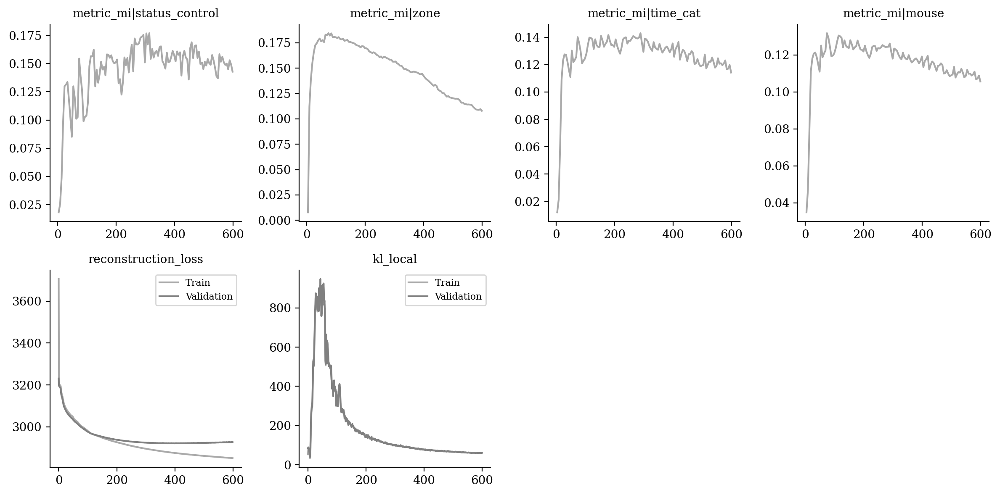

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

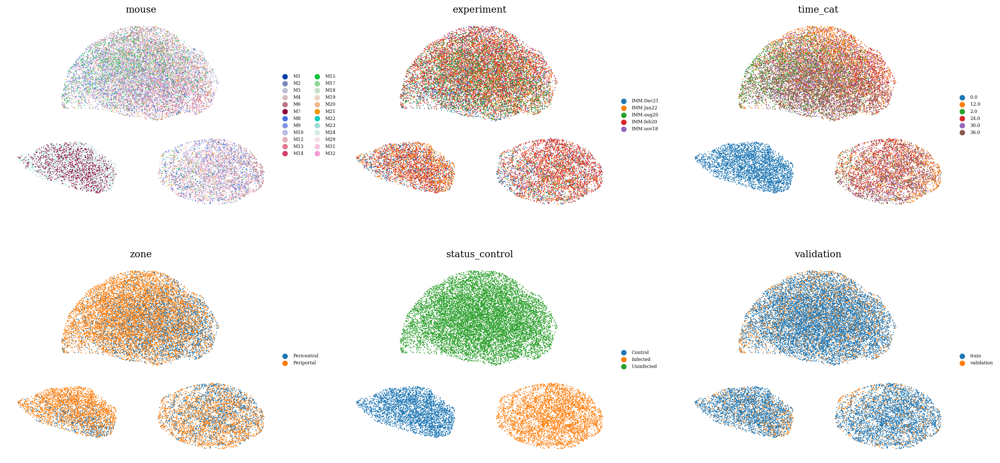

In [13]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

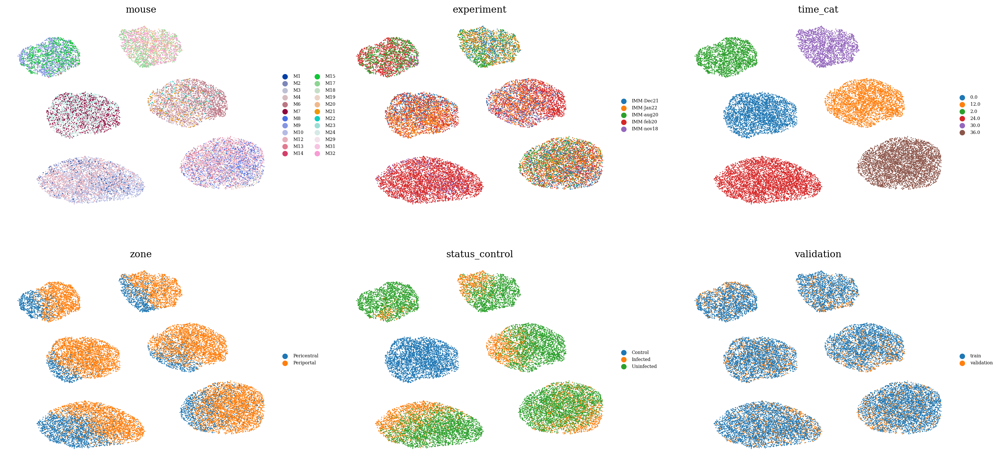

In [14]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

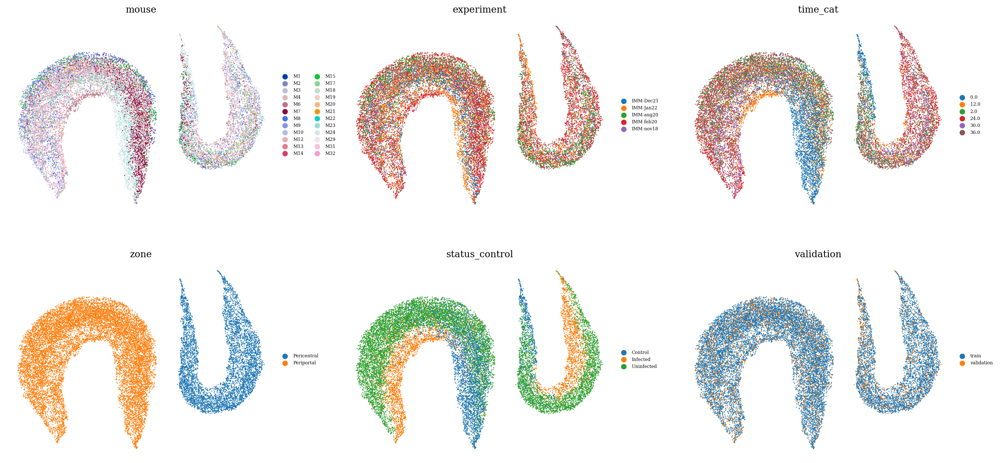

In [15]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

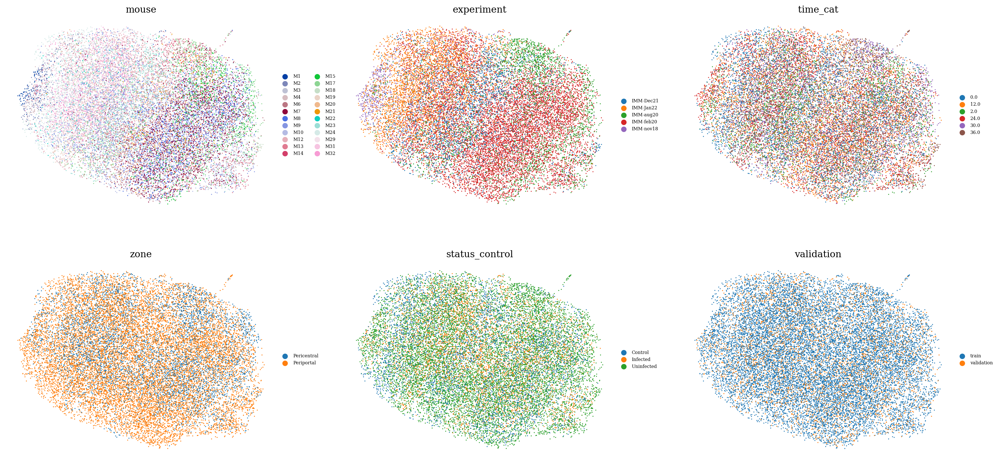

In [16]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )